# Insurance Claims- Fraud Detection

## Problem Statement:

### Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [1]:
# Importing the necessary libraries
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
# SETTING A customized plot style,font, figure and color
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = (10,7)
plt.rcParams['figure.facecolor'] = '#FFE554'

In [3]:
# loading the data
fraud = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
# importing data from github directly

In [4]:
# looking at the shape
fraud.shape

# There are 1000 rows and 40 columns

(1000, 40)

In [5]:
# Inorder to view all the columns while printing we are setting an option to display the maximum columns and rows
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [6]:
# looking at the first 20 rows
fraud.head(20)

# We can observe that there are special characters in some columns and null values as well

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


In [7]:
# looking at the last 20 rows
fraud.tail(20)


,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
980,245,40,908935,11-12-2009,IL,500/1000,1000,1361.45,0,604833,MALE,PhD,handlers-cleaners,camping,unmarried,39300,0,15-02-2015,Single Vehicle Collision,Rear Collision,Minor Damage,Ambulance,OH,Northbend,7570 Cherokee Drive,12,1,YES,0,2,YES,82170,7470,7470,67230,Suburu,Forrestor,1999,N,NaN
981,50,44,525862,18-10-2000,OH,250/500,2000,1188.51,0,447469,MALE,College,handlers-cleaners,bungie-jumping,unmarried,0,-65800,08-01-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,NY,Northbend,4710 Lincoln Hwy,15,3,?,1,2,NO,61100,6110,12220,42770,Dodge,Neon,2008,N,NaN
982,230,43,490514,09-02-2007,IN,500/1000,2000,1101.83,0,451529,MALE,High School,exec-managerial,cross-fit,other-relative,28900,0,01-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Arlington,7511 1st Ave,0,3,?,0,3,YES,51900,5190,10380,36330,BMW,M5,2011,Y,NaN
983,17,39,774895,28-10-2006,IL,250/500,1000,840.95,0,431202,FEMALE,JD,adm-clerical,hiking,unmarried,32500,-80800,26-02-2015,Parked Car,?,Trivial Damage,Police,SC,Arlington,7042 Maple Ridge,9,1,?,2,1,?,3440,430,430,2580,Suburu,Legacy,2002,N,NaN
984,163,36,974522,27-01-2000,IN,250/500,1000,1503.21,0,448190,MALE,MD,other-service,cross-fit,husband,55700,-49900,28-02-2015,Single Vehicle Collision,Side Collision,Total Loss,Ambulance,WV,Springfield,4475 Lincoln Ridge,1,1,YES,2,1,NO,51390,5710,11420,34260,Toyota,Corolla,2013,N,NaN
985,29,32,669809,05-04-2002,OH,100/300,1000,1722.50,0,453713,MALE,High School,other-service,base-jumping,wife,0,-21500,13-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Other,WV,Columbus,9439 MLK St,22,1,?,0,2,?,76900,7690,7690,61520,Jeep,Wrangler,1995,N,NaN
986,232,42,182953,30-04-2013,IN,100/300,500,944.03,0,440153,MALE,College,handlers-cleaners,kayaking,not-in-family,0,-58400,19-02-2015,Single Vehicle Collision,Rear Collision,Minor Damage,Other,WV,Riverwood,8269 Sky Hwy,11,1,YES,2,3,?,77000,15400,7700,53900,Toyota,Highlander,2015,Y,NaN
987,235,39,836349,01-05-2013,IL,500/1000,2000,1453.61,4000000,619570,MALE,JD,craft-repair,yachting,other-relative,0,0,13-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Other,NC,Hillsdale,5663 Oak Lane,10,1,?,0,3,?,60320,9280,9280,41760,Chevrolet,Tahoe,2012,Y,NaN
988,295,46,591269,09-01-1999,IN,100/300,500,1672.88,0,478947,FEMALE,High School,armed-forces,dancing,wife,0,0,17-02-2015,Single Vehicle Collision,Rear Collision,Minor Damage,Fire,NY,Columbus,4633 5th Lane,5,1,YES,1,1,NO,60700,12140,6070,42490,Honda,Civic,1997,N,NaN
989,22,21,550127,04-07-2007,IN,250/500,1000,1248.05,0,443550,FEMALE,High School,exec-managerial,movies,husband,37500,-54000,15-02-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Police,SC,Arlington,9682 Cherokee Ridge,3,3,YES,1,2,?,53280,5920,0,47360,Chevrolet,Malibu,2015,N,NaN


In [8]:
# looking at random 20 rows
fraud.sample(20)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
599,239,38,485642,25-08-1990,OH,250/500,1000,1276.73,5000000,610246,FEMALE,Masters,handlers-cleaners,bungie-jumping,other-relative,0,0,19-02-2015,Multi-vehicle Collision,Front Collision,Major Damage,Police,WV,Northbrook,4175 Elm Ridge,12,3,NO,1,3,?,61920,6880,6880,48160,Saab,93,2003,N,NaN
841,233,39,728839,02-01-2001,OH,500/1000,2000,1524.18,0,605220,MALE,JD,craft-repair,reading,unmarried,0,0,08-01-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Fire,SC,Northbrook,9148 4th Hwy,20,3,?,1,0,YES,48870,5430,5430,38010,Saab,95,1999,N,NaN
375,315,44,206667,05-05-1993,IL,250/500,1000,974.16,6000000,438328,FEMALE,Masters,sales,reading,other-relative,0,-56800,07-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Other,NY,Springfield,7576 Pine Ridge,12,3,?,1,0,YES,26730,4860,4860,17010,Volkswagen,Jetta,2006,N,NaN
657,252,39,261905,28-02-2004,IL,500/1000,500,1312.22,9000000,609949,MALE,High School,transport-moving,cross-fit,other-relative,0,-33300,21-02-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Other,NC,Riverwood,4835 Britain Ridge,15,3,?,0,3,NO,59400,11880,5940,41580,Jeep,Grand Cherokee,2010,Y,NaN
638,34,34,409074,19-03-1992,OH,500/1000,500,1295.87,0,438529,FEMALE,PhD,priv-house-serv,chess,husband,0,0,13-01-2015,Multi-vehicle Collision,Side Collision,Major Damage,Ambulance,NC,Columbus,3998 4th Hwy,4,3,?,1,0,NO,50800,5080,5080,40640,Audi,A3,1997,Y,NaN
109,87,31,853360,26-06-2009,IN,500/1000,1000,1074.07,0,451312,FEMALE,Masters,sales,chess,husband,0,-47500,27-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,NY,Springfield,3052 Weaver Ridge,16,3,NO,0,3,YES,60940,5540,11080,44320,Nissan,Ultima,2006,Y,NaN
557,63,26,550930,12-10-1995,IL,500/1000,500,1500.04,6000000,613826,MALE,PhD,craft-repair,polo,own-child,0,-36500,13-02-2015,Vehicle Theft,?,Minor Damage,Police,NC,Northbrook,1810 Elm Hwy,5,1,NO,0,2,YES,5160,860,860,3440,Accura,TL,2004,N,NaN
826,179,32,907012,15-12-1996,OH,500/1000,2000,1246.68,0,440251,FEMALE,PhD,priv-house-serv,movies,own-child,0,0,28-01-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NY,Arlington,2646 MLK Drive,10,1,?,0,1,?,53100,5900,5900,41300,Suburu,Impreza,2006,N,NaN
621,87,27,326289,03-01-2004,OH,100/300,500,1048.39,0,620962,FEMALE,Masters,transport-moving,polo,own-child,0,0,13-02-2015,Single Vehicle Collision,Side Collision,Minor Damage,Police,NY,Riverwood,6608 Apache Lane,2,1,?,2,1,YES,34650,6300,3150,25200,Ford,F150,1996,N,NaN
468,225,37,373600,01-12-2000,OH,100/300,1000,1217.84,5000000,443462,FEMALE,High School,farming-fishing,yachting,not-in-family,49600,0,07-02-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Fire,WV,Northbrook,6501 5th Drive,19,3,?,2,2,NO,57600,9600,9600,38400,Volkswagen,Passat,2015,N,NaN


In [9]:
# looking at the data info
fraud.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [10]:
# looking at the data desription
fraud.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,2.039540e+02,1.151132e+02,0.00,115.7500,199.5,276.250,479.00
age,1000.0,3.894800e+01,9.140287e+00,19.00,32.0000,38.0,44.000,64.00
policy_number,1000.0,5.462386e+05,2.570630e+05,100804.00,335980.2500,533135.0,759099.750,999435.00
policy_deductable,1000.0,1.136000e+03,6.118647e+02,500.00,500.0000,1000.0,2000.000,2000.00
policy_annual_premium,1000.0,1.256406e+03,2.441674e+02,433.33,1089.6075,1257.2,1415.695,2047.59
umbrella_limit,1000.0,1.101000e+06,2.297407e+06,-1000000.00,0.0000,0.0,0.000,10000000.00
insured_zip,1000.0,5.012145e+05,7.170161e+04,430104.00,448404.5000,466445.5,603251.000,620962.00
capital-gains,1000.0,2.512610e+04,2.787219e+04,0.00,0.0000,0.0,51025.000,100500.00
capital-loss,1000.0,-2.679370e+04,2.810410e+04,-111100.00,-51500.0000,-23250.0,0.000,0.00
incident_hour_of_the_day,1000.0,1.164400e+01,6.951373e+00,0.00,6.0000,12.0,17.000,23.00


In [11]:
# looking at the description of categorical data
fraud.describe(include='O').T

# We can see there are special characters '?' in property damage and report available

,count,unique,top,freq
policy_bind_date,1000,951,01-01-2006,3
policy_state,1000,3,OH,352
policy_csl,1000,3,250/500,351
insured_sex,1000,2,FEMALE,537
insured_education_level,1000,7,JD,161
insured_occupation,1000,14,machine-op-inspct,93
insured_hobbies,1000,20,reading,64
insured_relationship,1000,6,own-child,183
incident_date,1000,60,02-02-2015,28
incident_type,1000,4,Multi-vehicle Collision,419


## Checking the null values

In [12]:
fraud.isnull().sum()

# We can observe that _c39 column has all null values
# We can drop it

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [13]:
# checking if any other column has blank values(' '),special characters(?,-,_) etc to make sure the data is clean
# We clearly know that there are some special characters in some features

special_chars =[" ","?","-"," ?"," -","? ","- "," ? "," - ","NA","N/A"," NA"," N/A"] # making list of possible special characters 

for col in fraud.columns:
    for char in special_chars:
        print(f"{char} in {col} = ",end= " ")
        print((fraud[col] == char).sum())
        
# We can observe that there in collision_type there  178 '?' question marks, in property_damage   360 '?' and in police_report_available  343 '?'

  in months_as_customer =  0
? in months_as_customer =  0
- in months_as_customer =  0
 ? in months_as_customer =  0
 - in months_as_customer =  0
?  in months_as_customer =  0
-  in months_as_customer =  0
 ?  in months_as_customer =  0
 -  in months_as_customer =  0
NA in months_as_customer =  0
N/A in months_as_customer =  0
 NA in months_as_customer =  0
 N/A in months_as_customer =  0
  in age =  0
? in age =  0
- in age =  0
 ? in age =  0
 - in age =  0
?  in age =  0
-  in age =  0
 ?  in age =  0
 -  in age =  0
NA in age =  0
N/A in age =  0
 NA in age =  0
 N/A in age =  0
  in policy_number =  0
? in policy_number =  0
- in policy_number =  0
 ? in policy_number =  0
 - in policy_number =  0
?  in policy_number =  0
-  in policy_number =  0
 ?  in policy_number =  0
 -  in policy_number =  0
NA in policy_number =  0
N/A in policy_number =  0
 NA in policy_number =  0
 N/A in policy_number =  0
  in policy_bind_date =  0
? in policy_bind_date =  0
- in policy_bind_date =  0


In [14]:
# first let's just replace the '?' values in these columns with null values

fraud['collision_type'] = fraud['collision_type'].replace('?',np.nan)  

fraud['property_damage'] = fraud['property_damage'].replace('?',np.nan)

fraud['police_report_available'] = fraud['police_report_available'].replace('?',np.nan)


In [15]:
# checking the null values again
fraud.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

<AxesSubplot:>

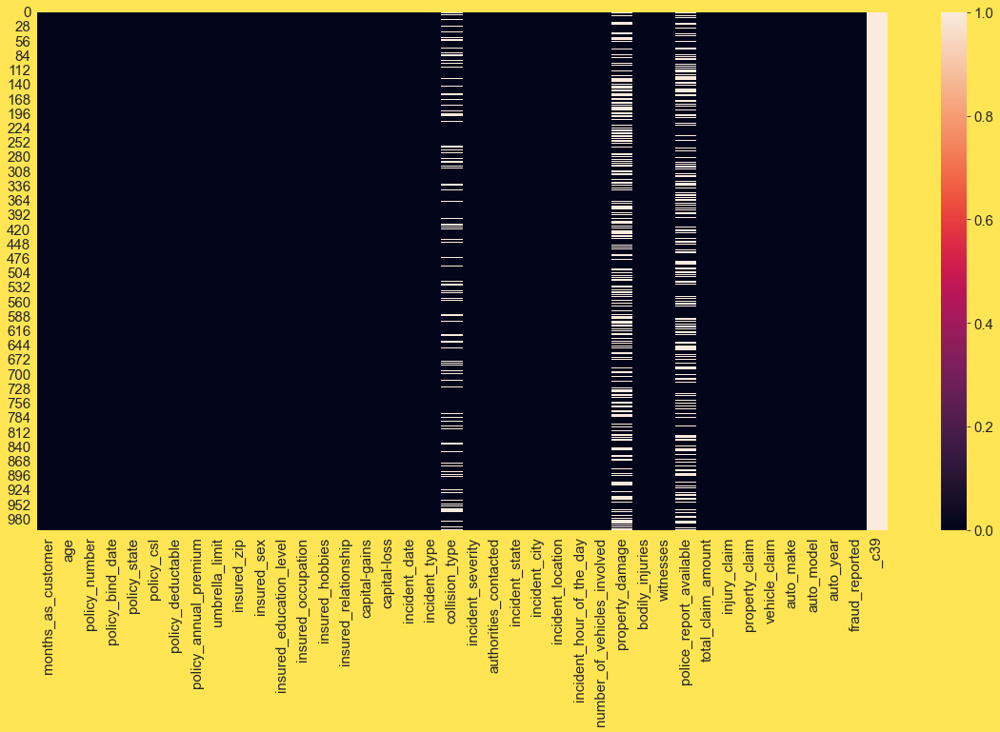

In [16]:
# lets plot a heatmap to clearly view the missing data
plt.figure(figsize=(20,10))
sns.heatmap(fraud.isnull())

In [17]:
# checking the datatypes
fraud.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [18]:
# looking at the % of null values in the null feature and the datatype pf those features
null_cols = ['collision_type','property_damage','police_report_available']
for i in null_cols:
    print('% of null values in',i,': ',fraud[i].isnull().sum()/1000*100,'dtype: ',fraud[i].dtype)
    
# There is high amount of null values in property damage and police_report_available features
# And both the features are Object Datatype
# He

% of null values in collision_type :  17.8 dtype:  object
% of null values in property_damage :  36.0 dtype:  object
% of null values in police_report_available :  34.300000000000004 dtype:  object


In [19]:
# Dropping _c39 column as the entire columns has null values
fraud.drop(['_c39'],axis=1,inplace=True)

In [20]:
fraud.shape

(1000, 39)

In [21]:
fraud.sample()
# We can see that _c39 has been removed

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
90,127,29,686816,07-12-1999,OH,250/500,2000,1326.44,5000000,436973,FEMALE,High School,sales,board-games,own-child,0,0,24-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Fire,SC,Arlington,8442 Britain Hwy,12,2,YES,1,1,NaN,66950,10300,10300,46350,Saab,93,1995,N


In [22]:
# checking the unique value count of null value columns
null_cols = ['collision_type','property_damage','police_report_available']
for i in null_cols:
    print(i.upper(),':-')
    print(fraud[i].unique())
    print(fraud[i].value_counts())
    print('\n')

COLLISION_TYPE :-
['Side Collision' nan 'Rear Collision' 'Front Collision']
Rear Collision     292
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


PROPERTY_DAMAGE :-
['YES' nan 'NO']
NO     338
YES    302
Name: property_damage, dtype: int64


POLICE_REPORT_AVAILABLE :-
['YES' nan 'NO']
NO     343
YES    314
Name: police_report_available, dtype: int64




In [23]:
# Since all the null_cols are categorical
# Lets check the mode of these columns
for i in null_cols:
    print('Mode of',i,'is',fraud[i].mode()[0])

Mode of collision_type is Rear Collision
Mode of property_damage is NO
Mode of police_report_available is NO


In [24]:
# Checking the % contribution of the mode values to each null value features
#checking the % share of most frequently occuring value in the null columns
for i in null_cols:
    print(fraud[i].mode()[0],'is contributing',round((fraud[i] == fraud[i].mode()[0]).sum()/fraud[i].count()*100,2),'% ','to the',i,'column.')

Rear Collision is contributing 35.52 %  to the collision_type column.
NO is contributing 52.81 %  to the property_damage column.
NO is contributing 52.21 %  to the police_report_available column.


In [25]:
# Now Let's go ahead and impute the columns with their mode
# importing Simple Imputer
from sklearn.impute import SimpleImputer

In [26]:
si = SimpleImputer(missing_values = np.nan,strategy = 'most_frequent',verbose = 0 )

In [27]:
for i in null_cols:
    
    si = si.fit(fraud[[i]]) # fitting the imputer
    fraud[[i]] = si.transform(fraud[[i]]) # transforming the null values

In [28]:
# Checking the null values again
fraud.isnull().sum()

# We can see now the null values are being handled

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

<AxesSubplot:>

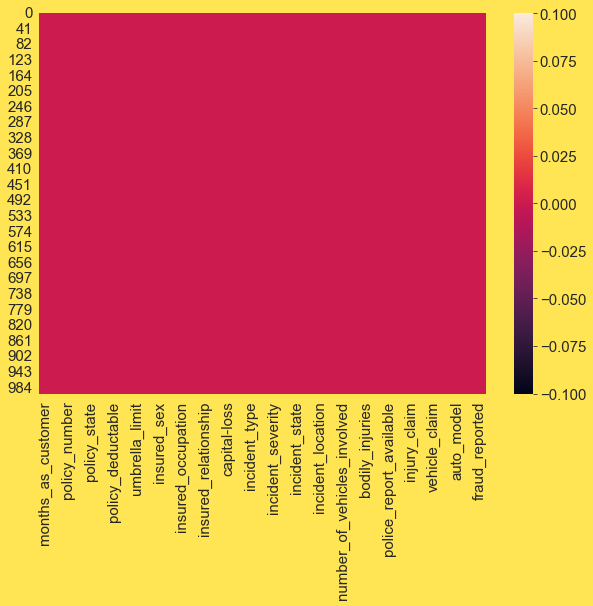

In [29]:
# plotting heatmap 
sns.heatmap(fraud.isnull())

In [30]:
# Looking at the count of unique values in each column
fraud.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    3
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [31]:
# We can see that policy_number and incident_location are having all unique values
# It makes no sense to Analyse this data and we cannot use it for model building as well
# And policy number will be unique for every person, so is the incident_location in this data.
# And policy number should be categorical as each person has a unique number 
# So we will drop these columns
fraud.drop(['policy_number','incident_location'],axis=1,inplace=True)

In [32]:
fraud.shape
# two columns have been dropped

(1000, 37)

In [33]:
# Similarly with Insured_zip there are almost 995 unique values.
# These are just zip codes and are unique to each customer.
# There is non point in analysing this column and we cannot use it for model building as well
fraud['insured_zip'].head(10)

0    466132
1    468176
2    430632
3    608117
4    610706
5    478456
6    441716
7    603195
8    601734
9    600983
Name: insured_zip, dtype: int64

In [34]:
# So we are going to drop insured_zip
fraud.drop(['insured_zip'],axis=1,inplace=True)

In [35]:
fraud.sample(10)

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
830,148,36,04-01-1996,IL,500/1000,1000,1236.32,5000000,FEMALE,MD,adm-clerical,hiking,own-child,55100,0,10-01-2015,Single Vehicle Collision,Side Collision,Total Loss,Police,PA,Northbrook,0,1,NO,2,0,NO,61050,5550,11100,44400,Dodge,Neon,2009,N
867,212,39,17-03-2010,OH,100/300,1000,1255.35,0,FEMALE,JD,protective-serv,skydiving,not-in-family,60300,-58900,14-02-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Ambulance,NY,Riverwood,22,2,NO,0,3,YES,59300,11860,5930,41510,Dodge,RAM,2008,N
252,242,40,10-02-1998,OH,100/300,500,1238.65,0,FEMALE,High School,transport-moving,bungie-jumping,husband,0,-44600,27-01-2015,Vehicle Theft,Rear Collision,Trivial Damage,Police,WV,Springfield,5,1,YES,1,1,NO,7480,680,680,6120,Saab,95,1998,N
263,244,40,11-08-1999,IN,500/1000,2000,1304.67,7000000,MALE,Masters,armed-forces,base-jumping,other-relative,0,-45000,10-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,SC,Hillsdale,5,3,NO,1,1,NO,61490,5590,11180,44720,Dodge,RAM,2001,N
730,116,31,09-11-2008,IN,250/500,500,1194.83,0,FEMALE,MD,prof-specialty,camping,husband,28600,0,20-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Riverwood,23,1,NO,0,0,NO,44200,4420,8840,30940,Suburu,Forrestor,1997,N
461,410,54,29-08-2010,IL,100/300,2000,714.03,0,MALE,MD,protective-serv,board-games,own-child,0,-17000,16-02-2015,Single Vehicle Collision,Side Collision,Minor Damage,Ambulance,WV,Northbend,0,1,YES,0,2,NO,59520,9920,9920,39680,Honda,Accord,2001,N
892,215,35,15-06-2004,IL,500/1000,1000,1125.40,0,MALE,Masters,adm-clerical,yachting,husband,40000,-43400,15-01-2015,Vehicle Theft,Rear Collision,Trivial Damage,None,WV,Columbus,6,1,NO,2,1,NO,2640,220,440,1980,Jeep,Wrangler,2001,N
274,217,39,15-03-1992,IL,500/1000,2000,1399.85,0,FEMALE,Masters,other-service,skydiving,other-relative,49900,-19800,10-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Fire,NY,Columbus,16,3,NO,0,2,NO,64920,10820,10820,43280,Ford,Fusion,1997,N
596,286,41,12-09-2001,IL,100/300,500,1106.77,0,FEMALE,College,prof-specialty,golf,other-relative,45500,-62500,26-02-2015,Parked Car,Rear Collision,Trivial Damage,Police,WV,Columbus,3,1,NO,2,0,NO,5000,500,500,4000,Dodge,RAM,2003,N
58,11,39,19-05-1993,IL,250/500,2000,1470.06,0,MALE,PhD,other-service,yachting,husband,56600,-45800,07-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Ambulance,WV,Riverwood,22,1,YES,0,1,NO,65790,7310,7310,51170,Saab,93,2007,N


In [36]:
# looking at policy_csl feature
# policy csl- combined limit policy means the insurance is applicable to any combination of property damage liability and bodily injury claims
fraud['policy_csl'].value_counts()

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64

In [37]:
# so let's seperate the person's and accident limit
#Extracting columns from policy_csl
fraud['csl_per_person'] = fraud['policy_csl'].str.split('/', expand=True)[0]
fraud['csl_per_accident'] = fraud['policy_csl'].str.split('/', expand=True)[1]

In [38]:
# As part of extracting the person and acccident csl we have converted the new features to object
# Now let's go ahead and convert them back to integer
fraud[['csl_per_person']] = fraud[['csl_per_person']].astype('int64')
fraud[['csl_per_accident']] = fraud[['csl_per_accident']].astype('int64')

In [39]:
#Droping policy_csl column after extraction as we don't need it for analysis and model
fraud.drop(["policy_csl"],axis=1,inplace=True)

In [40]:
# looking at th umbrella_limit column
fraud['umbrella_limit'].value_counts()

# We can see most of the values are zeroes

 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

In [41]:
# checking the % of 0's in umbrella_limit feature
round((fraud['umbrella_limit'] == fraud['umbrella_limit'].mode()[0]).sum()/fraud[i].count()*100,2)

# We can see almost 80% of the values are of zeroes
# So we are going to drop this feature

79.8

In [42]:
fraud.drop(['umbrella_limit'],axis=1,inplace=True)

In [43]:
fraud.sample(5)

,months_as_customer,age,policy_bind_date,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident
773,174,33,07-04-2014,IN,2000,1124.43,FEMALE,College,farming-fishing,paintball,own-child,0,0,16-01-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Ambulance,WV,Northbrook,14,3,YES,0,1,YES,44200,8840,4420,30940,Saab,93,1995,N,250,500
127,165,32,04-06-2012,IN,500,1399.26,FEMALE,High School,tech-support,exercise,own-child,70500,0,08-02-2015,Parked Car,Rear Collision,Minor Damage,Police,PA,Northbrook,9,1,NO,2,0,NO,3960,330,660,2970,BMW,M5,1998,N,500,1000
324,97,26,04-11-1991,IL,1000,1252.08,MALE,College,exec-managerial,sleeping,not-in-family,0,0,08-02-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Other,VA,Springfield,4,2,YES,2,2,NO,50400,10080,5040,35280,Honda,CRV,2000,Y,250,500
885,254,45,17-09-2003,IL,500,1083.64,MALE,JD,other-service,paintball,husband,59800,0,27-02-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Police,NC,Columbus,19,3,YES,0,0,NO,79680,13280,13280,53120,BMW,3 Series,2004,N,250,500
250,117,28,21-04-2003,OH,500,1264.77,FEMALE,Associate,transport-moving,yachting,unmarried,47500,-32500,05-02-2015,Multi-vehicle Collision,Rear Collision,Total Loss,Fire,SC,Springfield,13,2,YES,0,1,NO,55440,5040,10080,40320,Suburu,Forrestor,2009,Y,250,500


In [44]:
# We have two features which are dates
print(fraud['policy_bind_date'].dtype)
print(fraud['incident_date'].dtype)

# We can see both these are object datatype
# let's convert them to datetime datatype for analysis and model

object
object


In [45]:
#Converting object data type to datetime 
fraud['policy_bind_date'] =  pd.to_datetime(fraud['policy_bind_date'])
fraud['incident_date'] =  pd.to_datetime(fraud['incident_date'])

In [46]:
print(fraud['policy_bind_date'].dtype)
print(fraud['incident_date'].dtype)

# We can see that the datatype has been changed

datetime64[ns]
datetime64[ns]


In [47]:
# Extracting Day, Month and Year column from policy_bind_date
fraud["policy_bind_Day"] = fraud['policy_bind_date'].dt.day
fraud["policy_bind_Month"] = fraud['policy_bind_date'].dt.month
fraud["policy_bind_Year"] = fraud['policy_bind_date'].dt.year

# Extracting Day, Month and Year column from incident_date
fraud["incident_Day"] = fraud['incident_date'].dt.day
fraud["incident_Month"] = fraud['incident_date'].dt.month
fraud["incident_Year"] = fraud['incident_date'].dt.year

In [48]:
#Droping policy_bind_date column after extraction
fraud.drop(["policy_bind_date"],axis=1,inplace=True)

In [49]:
#Droping incident_date column after extraction
fraud.drop(["incident_date"],axis=1,inplace=True)

In [50]:
fraud['auto_year'].unique()

array([2004, 2007, 2014, 2009, 2003, 2012, 2015, 1996, 2002, 2006, 2000,
       2010, 1999, 2011, 2005, 2008, 1995, 2001, 1998, 1997, 2013],
      dtype=int64)

In [51]:
# We have a feature auto_year which is the year the vehicle has been purchased by the customer
# So instead of just keeping this feature let's extract a new feature which describes how old is the vehicle.
# We can don it by simple subtracting the auto_year from the current year.
# Extracting auto_age from auto year
fraud['auto_age'] = 2022 - fraud['auto_year']

In [52]:
# Now let's drop auto_year column after extraction
fraud.drop(["auto_year"],axis=1,inplace=True)

In [53]:
fraud.sample(3)

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year,auto_age
678,276,45,IL,500,948.10,FEMALE,High School,machine-op-inspct,reading,wife,44500,-61400,Multi-vehicle Collision,Front Collision,Minor Damage,Fire,SC,Columbus,11,3,NO,0,2,NO,69300,13860,6930,48510,Ford,Escape,N,500,1000,22,3,2000,1,6,2015,12
353,475,57,OH,500,1216.56,MALE,Masters,adm-clerical,skydiving,own-child,67400,-83200,Single Vehicle Collision,Front Collision,Minor Damage,Police,SC,Hillsdale,20,1,NO,0,2,NO,78000,6500,13000,58500,Suburu,Forrestor,N,100,300,18,2,1995,31,1,2015,22
55,22,26,OH,1000,1276.57,MALE,PhD,craft-repair,skydiving,not-in-family,71500,0,Single Vehicle Collision,Rear Collision,Minor Damage,Fire,NY,Arlington,3,1,YES,1,2,NO,78900,15780,7890,55230,Chevrolet,Silverado,N,100,300,8,11,2007,1,6,2015,27


## Univariate Analysis

In [54]:
# seperating the object datatypes
# seperating categorical and continuous columns
cat_cols = fraud.dtypes[fraud.dtypes == 'object'].index.tolist()
cat_cols

['policy_state',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


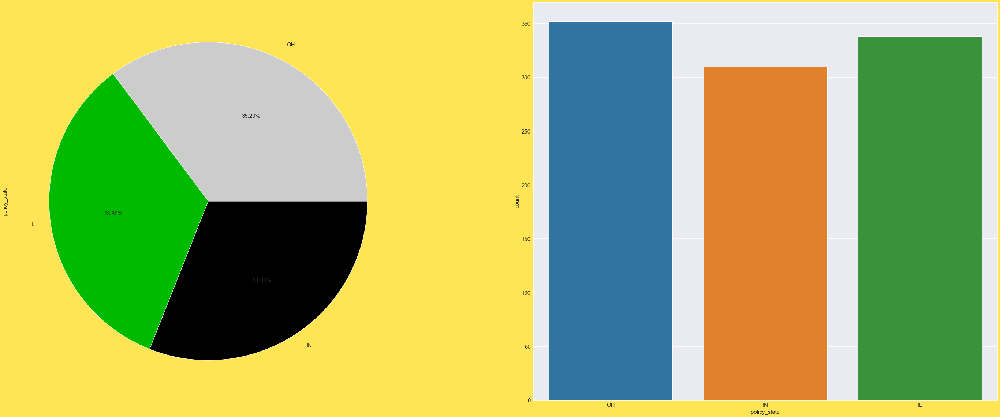

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


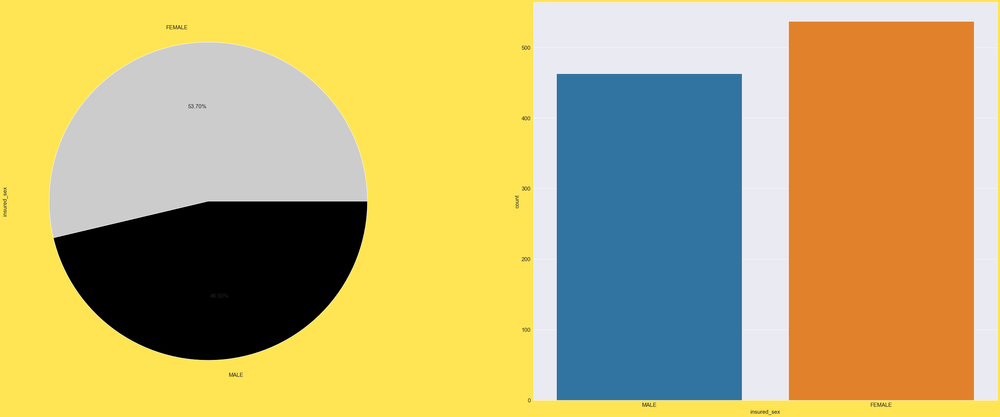

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


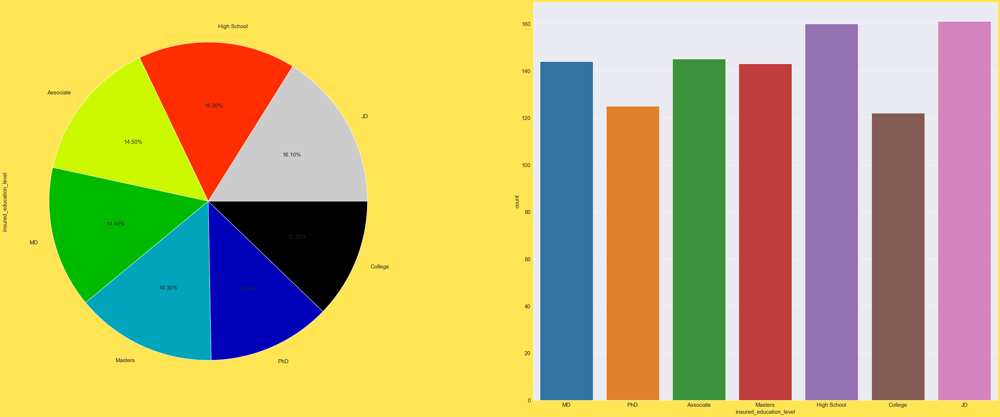

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


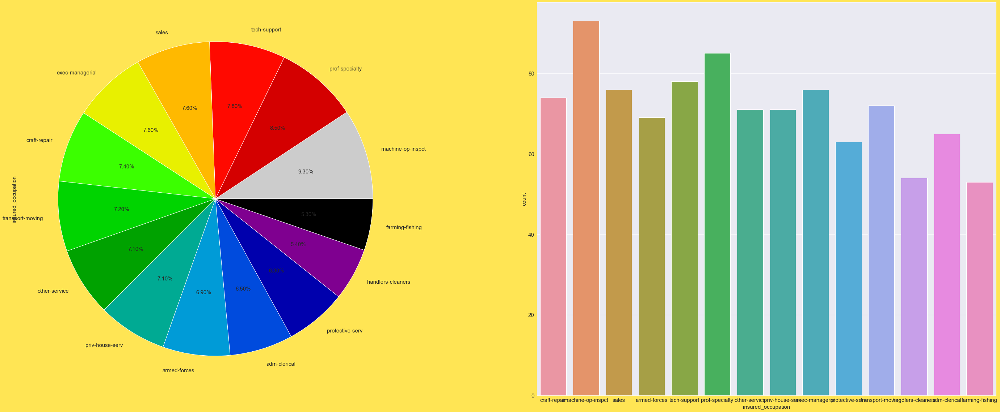

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


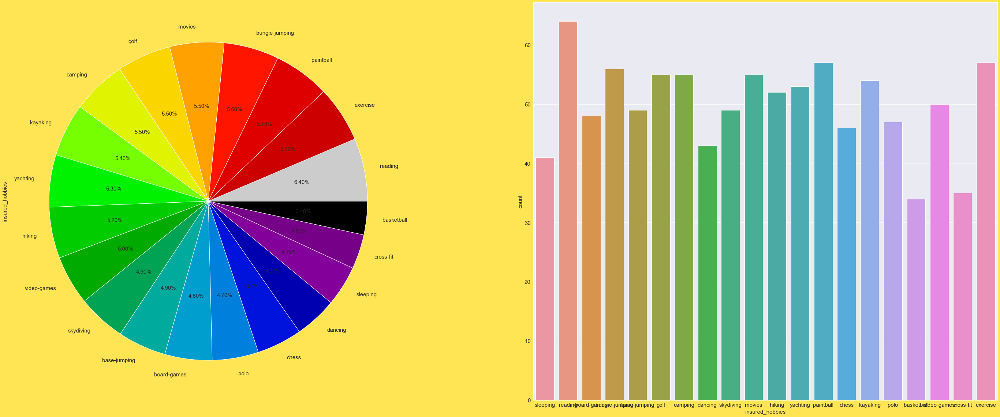

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


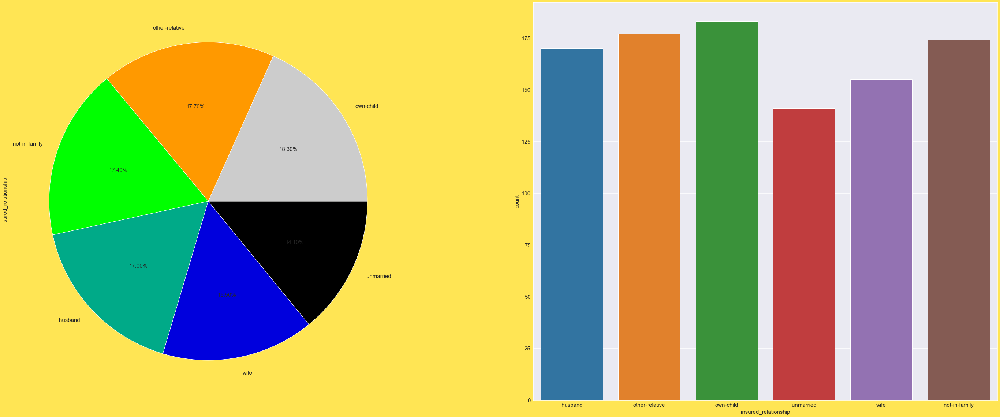

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


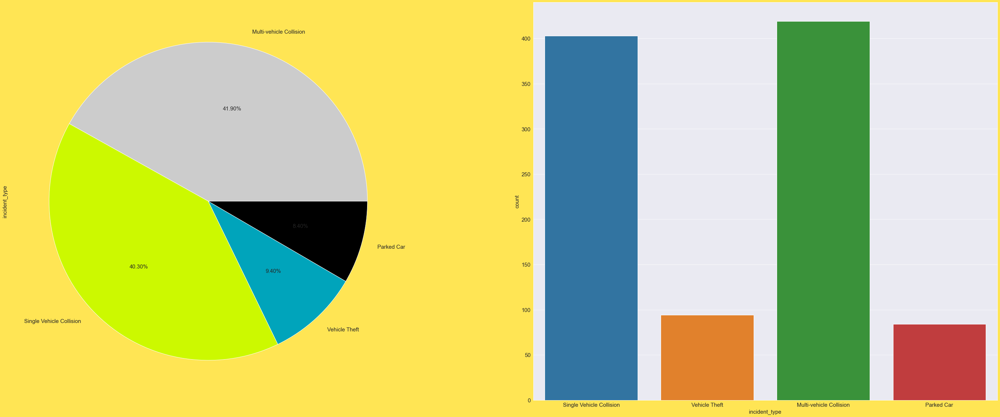

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


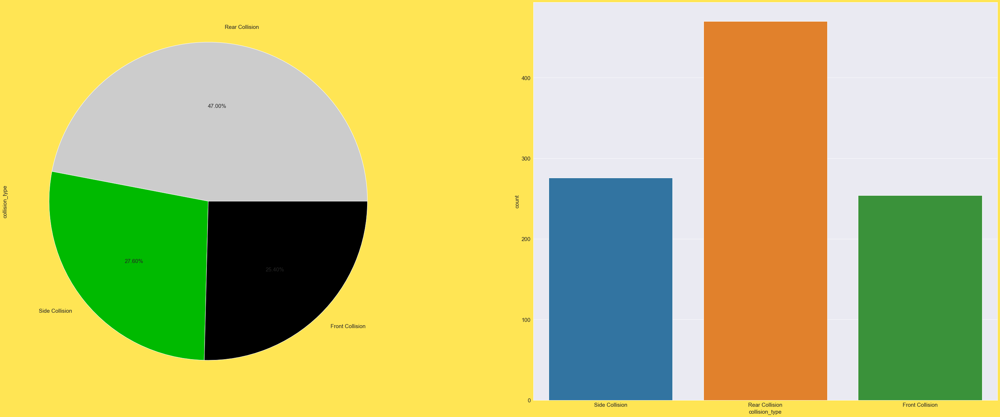

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


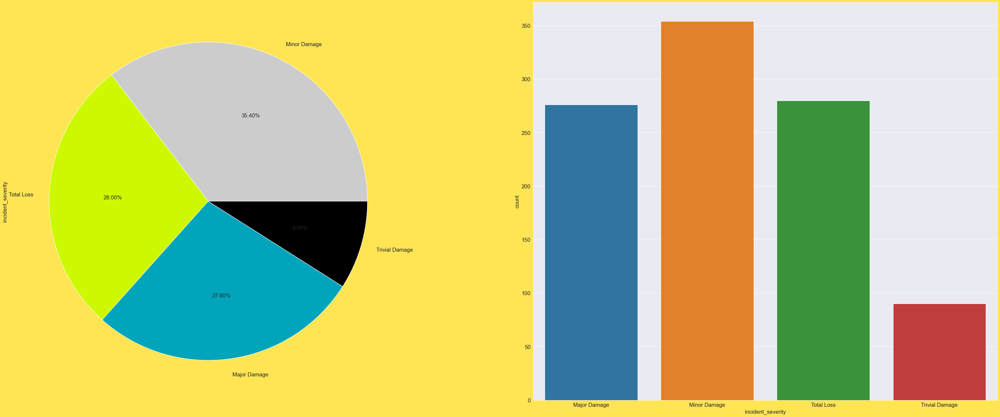

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


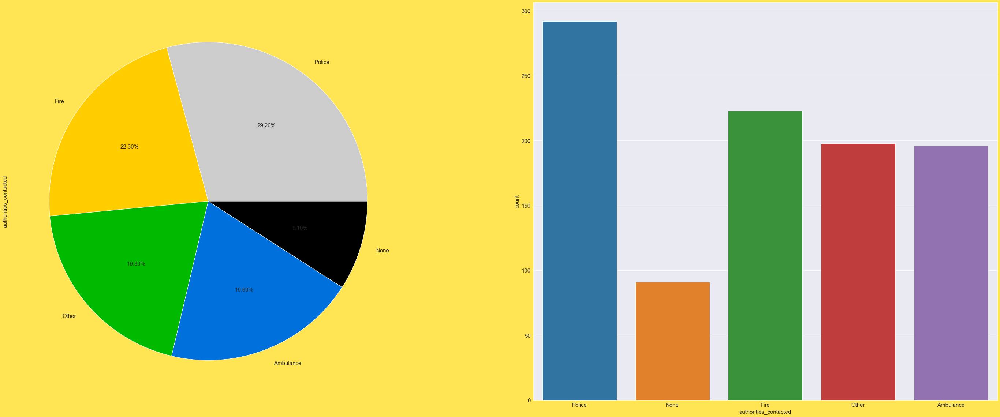

NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


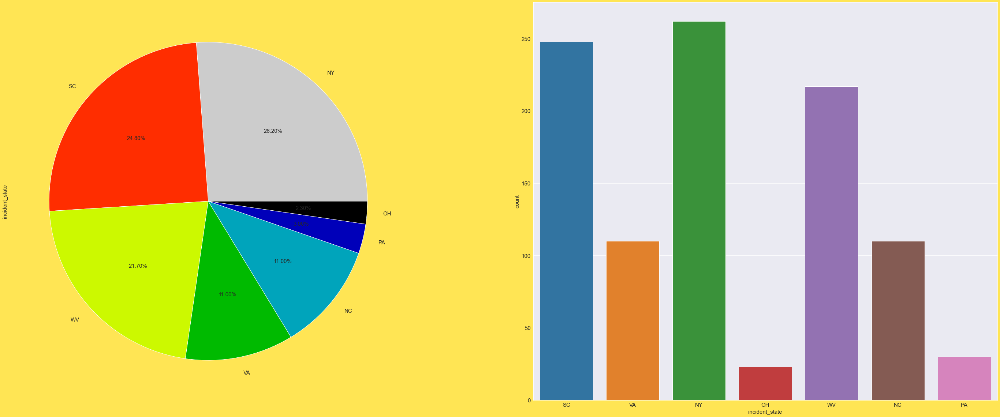

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


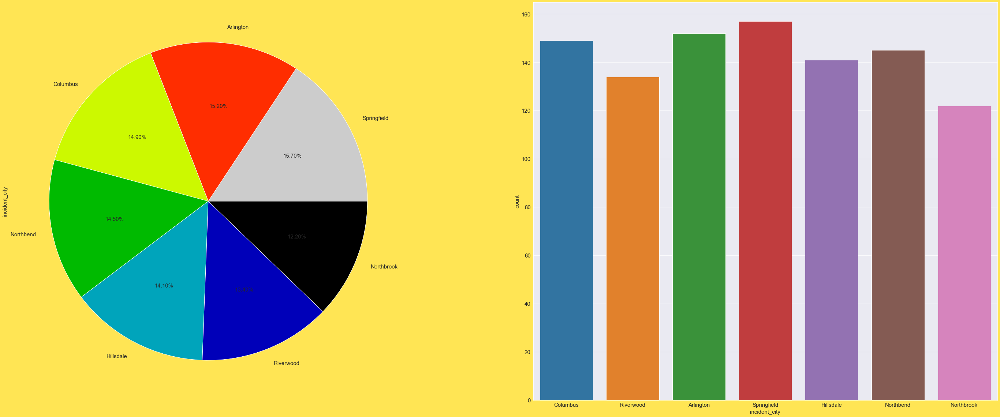

NO     698
YES    302
Name: property_damage, dtype: int64


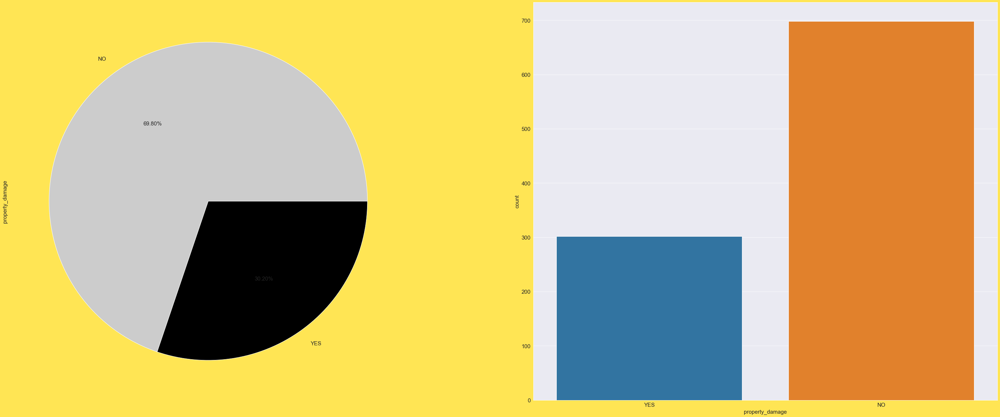

NO     686
YES    314
Name: police_report_available, dtype: int64


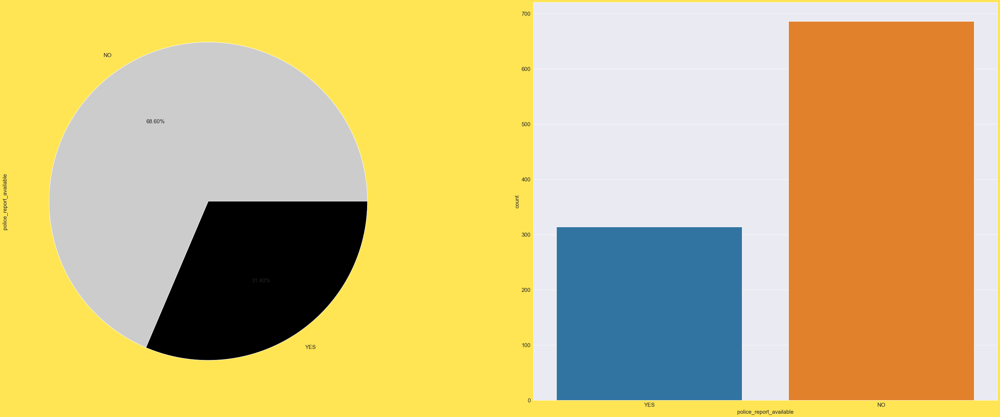

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


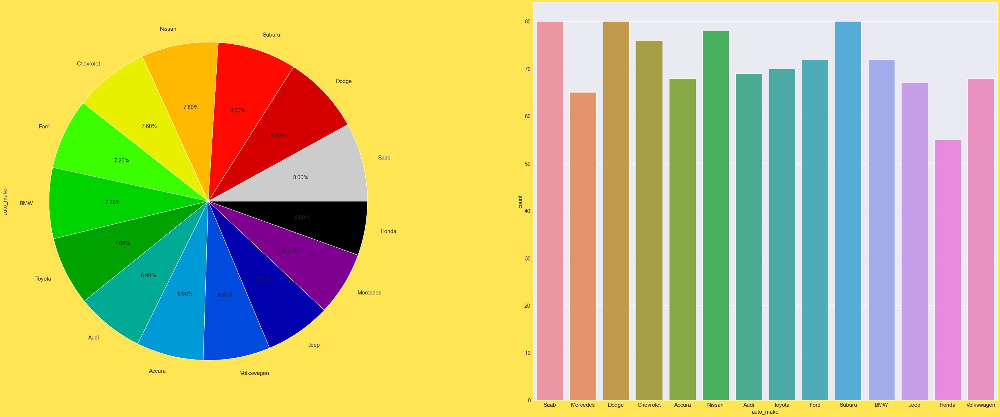

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


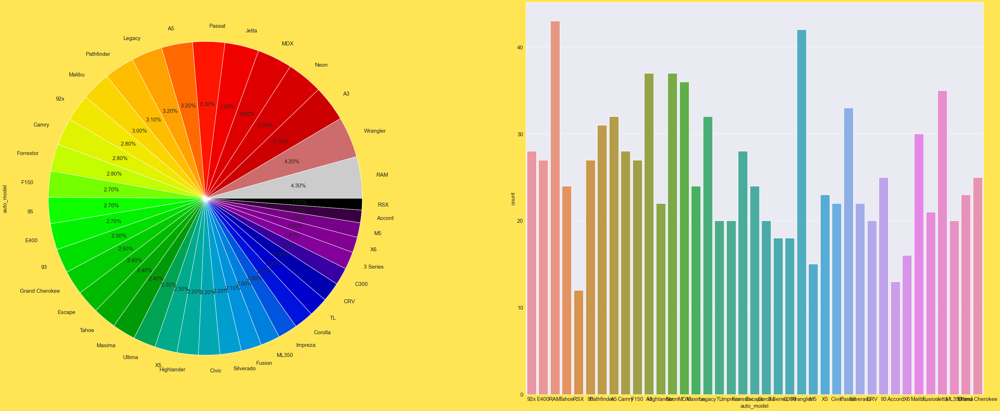

N    753
Y    247
Name: fraud_reported, dtype: int64


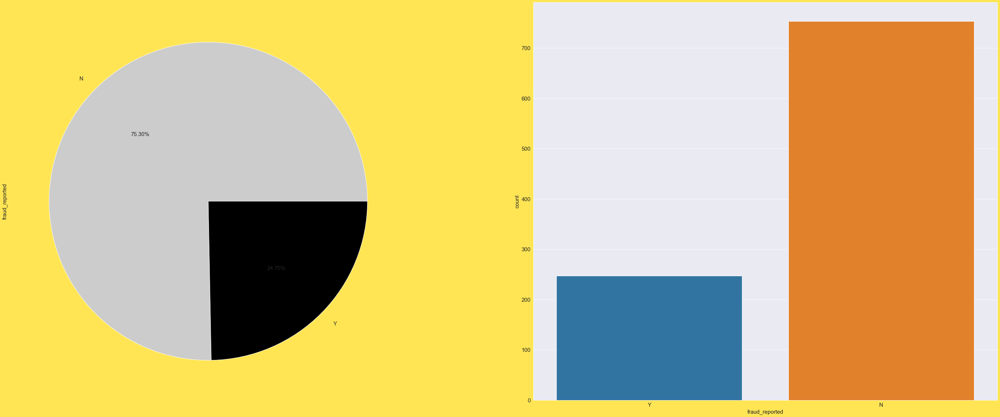

In [55]:
# let's visualise these cat_cols using count plots to check the unique value count
for i in cat_cols:
    
    plt.figure(figsize=(50,20))
    plt.subplot(1,2,2)
    sns.countplot(i,data=fraud)
    plt.subplot(1,2,1)
    fraud[i].value_counts().plot.pie(autopct='%1.2f%%',cmap ='nipy_spectral_r')
    print(fraud[i].value_counts())
    plt.show()

Observations:-

-> We can see that OH(ohio) category in policy_state is highest foloowed bu IL(illinois).

-> Around 53% women are insured and men is only 46.3%.

-> JD High school qualified customers are slightly more in number, following highschool and Associate.

-> Alost 9.5% people occupation is machine-op-inspct followed by prof-speciality and tech-support with with 8.5% and 7.8% respectively.

-> Majority of the insured people are having reading as their hobbies followed by excercise and paintball.

-> own-child has maximum count in insured_relationship.

-> Multi-vehicle-collision and single-vehicle-collision are significantly higher in number.

-> Rear Collision type accidents are more than front collision.

-> In Around 35% of accidents the incident_severity is Minor damage and total loss and major damage rate is almost similar.

-> Majority of the people contacted police, and sometimes fire authorities as well if the incident_severity is major or total loss

-> Surprisingly only 19% of time ambulance has been contacted.

-> Majority of the cases were registered in NY(Newyork) followed by SC(South Carolina).

-> Springfield city has more incidents followed by Arlington and Columbus.

-> There is very less count for property damage.

-> Very less cases have police_report_available.

-> Both 250 and 100 have same count in cls_per_person.

-> Both 500 and 300 have same count in cls_per_accident.

-> Saab, Dodge and Suburu car companies have significantly highest incidents compared to other brand cars. Honda is the lowest

-> Ram and Wrangler car models have highest cases followed by Neon , A3, Mdx and Jetta respectively

In [56]:
# seperating the continuous columns
cont_cols = fraud.dtypes[fraud.dtypes != 'object'].index.tolist()
cont_cols

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'csl_per_person',
 'csl_per_accident',
 'policy_bind_Day',
 'policy_bind_Month',
 'policy_bind_Year',
 'incident_Day',
 'incident_Month',
 'incident_Year',
 'auto_age']

In [57]:
# checking the number of unique values in cont_cols
for i in cont_cols:
    print(i,': ',fraud[i].nunique(),'-',fraud[i].dtype)
    print('\n')

months_as_customer :  391 - int64


age :  46 - int64


policy_deductable :  3 - int64


policy_annual_premium :  991 - float64


capital-gains :  338 - int64


capital-loss :  354 - int64


incident_hour_of_the_day :  24 - int64


number_of_vehicles_involved :  4 - int64


bodily_injuries :  3 - int64


witnesses :  4 - int64


total_claim_amount :  763 - int64


injury_claim :  638 - int64


property_claim :  626 - int64


vehicle_claim :  726 - int64


csl_per_person :  3 - int64


csl_per_accident :  3 - int64


policy_bind_Day :  31 - int64


policy_bind_Month :  12 - int64


policy_bind_Year :  26 - int64


incident_Day :  22 - int64


incident_Month :  12 - int64


incident_Year :  1 - int64


auto_age :  21 - int64




In [58]:
# seperating the discrete continuous features
discrete_features = [feature for feature in cont_cols if len(fraud[feature].unique())<61]
# here we are taking < 61 because the if we see in the unique value counts 61 unique variables are the least highest unique values.
# And we are filtering that 60 unique features column as well as a discrete feature

In [59]:
discrete_features

['age',
 'policy_deductable',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'csl_per_person',
 'csl_per_accident',
 'policy_bind_Day',
 'policy_bind_Month',
 'policy_bind_Year',
 'incident_Day',
 'incident_Month',
 'incident_Year',
 'auto_age']

In [60]:
# Creating a function for histogram plots of these columns
def histogram(fraud,cont_cols):
    # creating a  copy of dataframe
    data = fraud[cont_cols].copy()
    # subplots 
    fig, axes = plt.subplots(nrows=len(data.columns)//2, ncols=2,figsize=(50,50))
    fig.subplots_adjust(hspace=0.7)
    
    # our main distplot
    for ax, feature in zip(axes.flatten(), data.columns):
        plt.figure(figsize=(20,10))
        sns.histplot(data[feature],ax=ax,palette='hls')
        ax.set_title(f'Histogram of {feature}')
    plt.show()

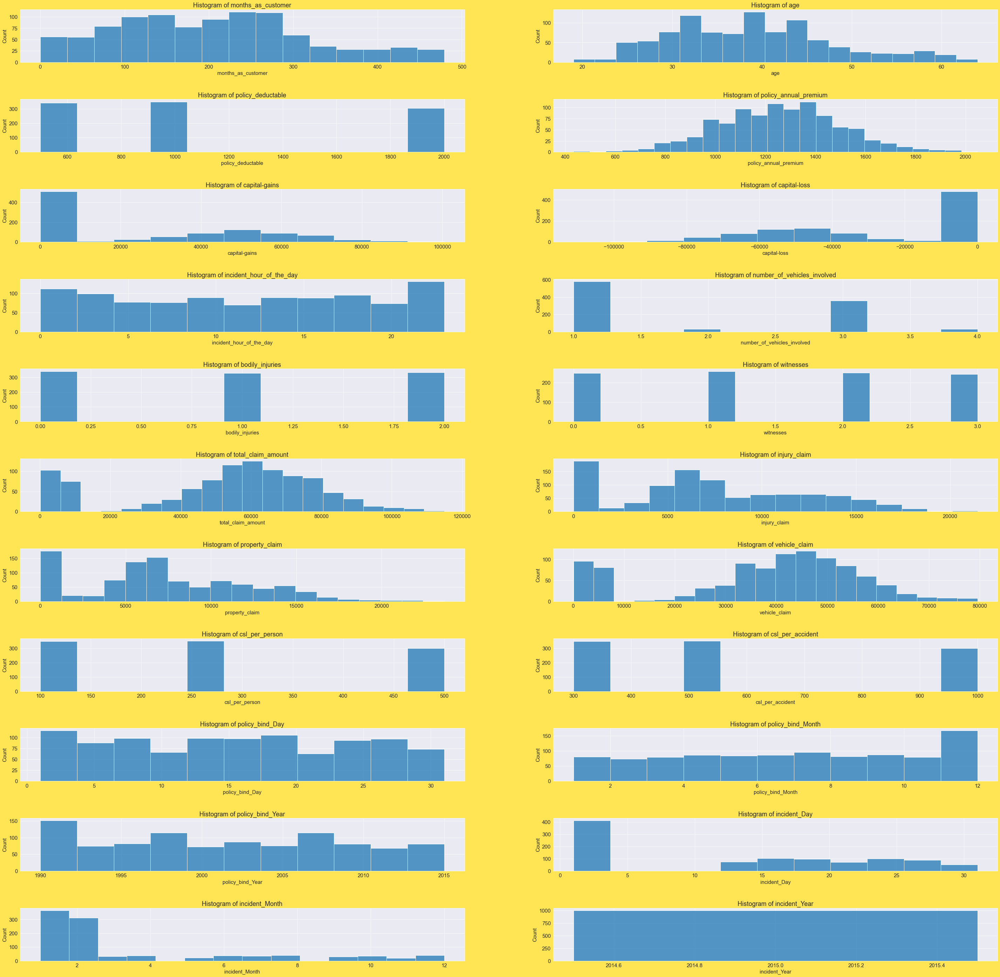

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

In [61]:
histogram(fraud,cont_cols)

Observations:-
    
-> We can observe that most of the customers have a tenure with the policy range from 200-300.

-> Most of the customers are aged from above 30 to under 40.

-> Policy_bind_date was highest in 1992. Since then upto 2016, it never reached that mark again.

-> Majority of the people are paying policy_annual_premium from 1200-1400 dollars.

-> Most of the incidents occured between 2015-01 to 2015-03 and most of them occured after 8:00 or 20:00
    
-> Many a time only one vehicle itself was involved and at times 3.

-> body_injuries and witnesses are same in number.

-> The total_claim amount was mostly in the range 4000-9000 dollars.

-> Majority of the times there were no injury and property claims. But if there is one, it mostly was in the range 5000-10000.

-> And vehicle claim amount was mostly in the range 3000-9000.

## Bivariate Analysis

In [62]:
# Analysing the categorical variables with respect to the Target Fraud_reported
# removing fraud reported from the cat_cols
cat_cols.remove('fraud_reported')
cat_cols

['policy_state',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model']

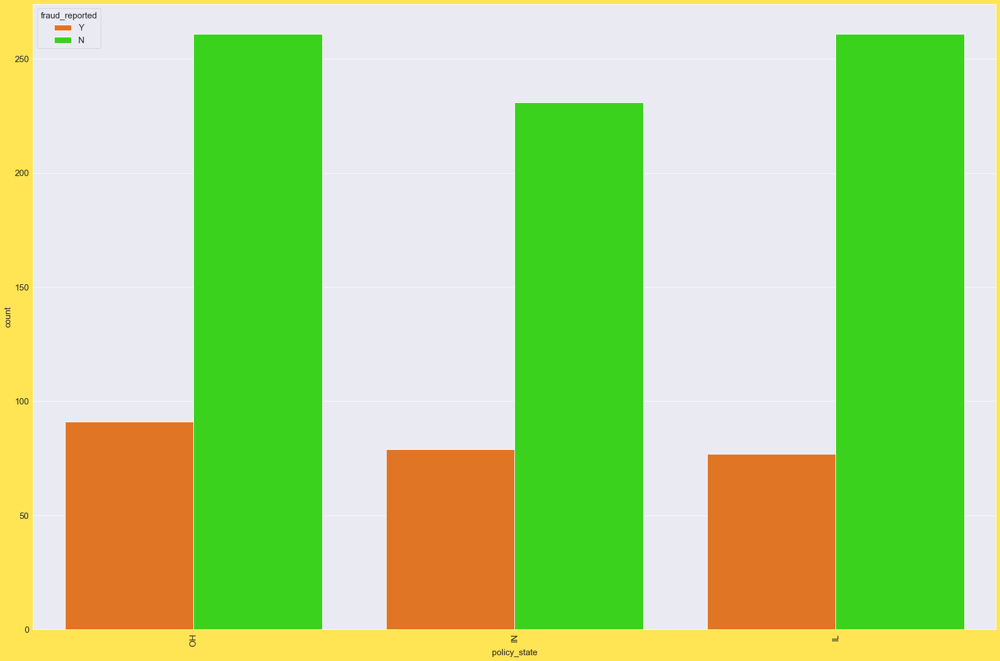

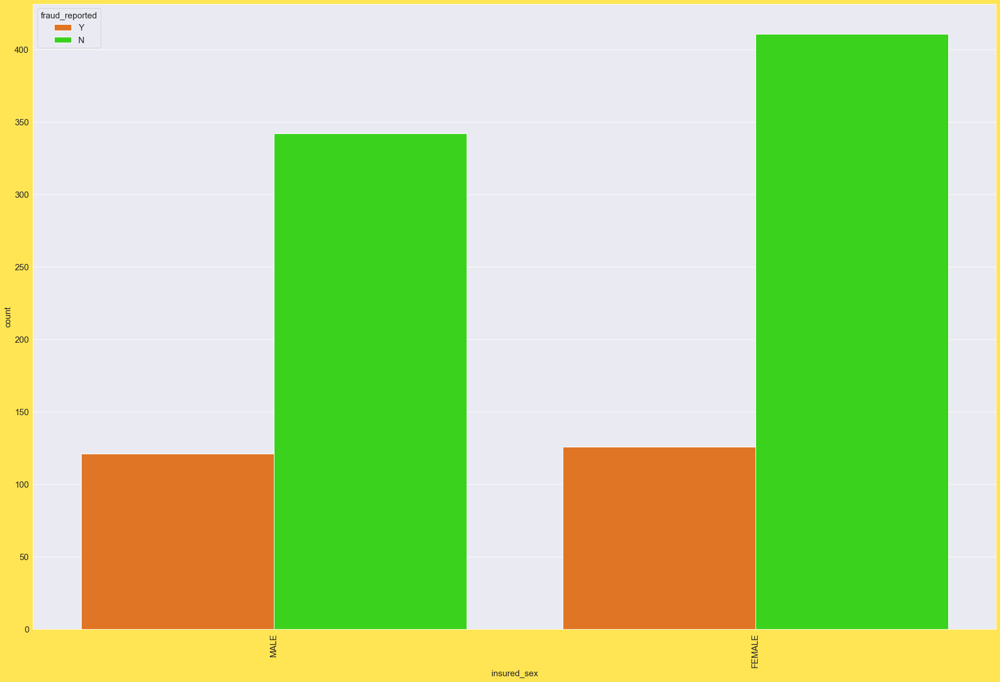

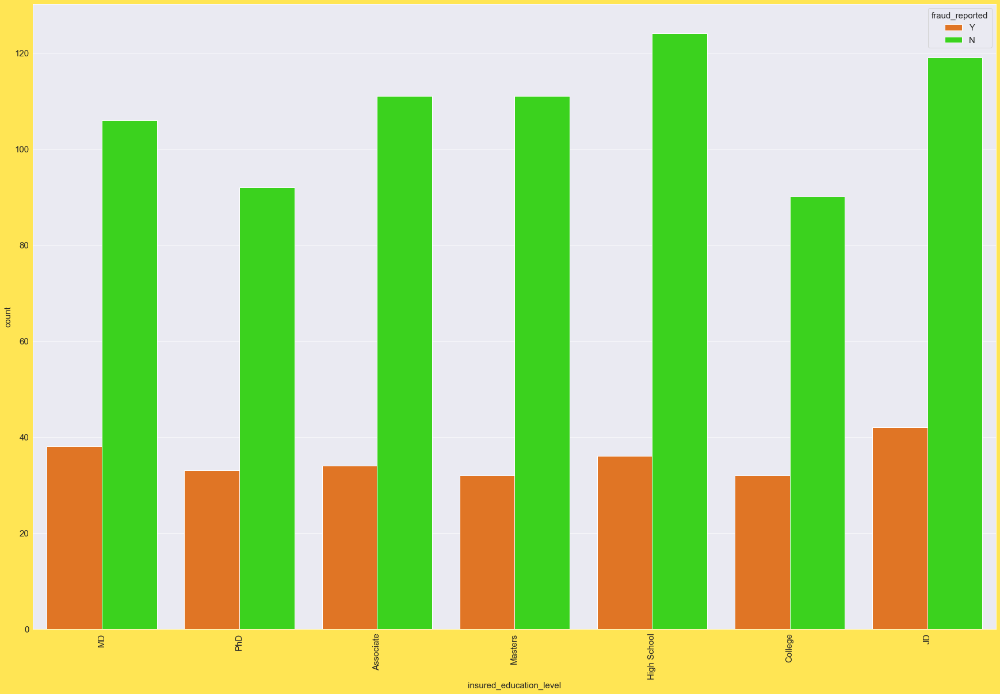

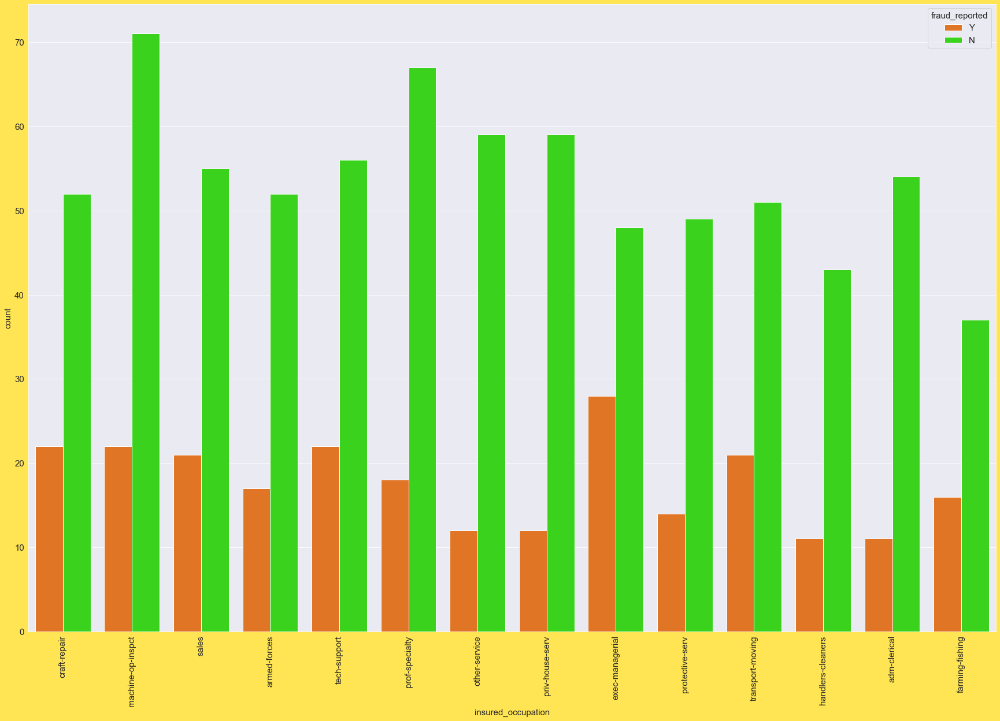

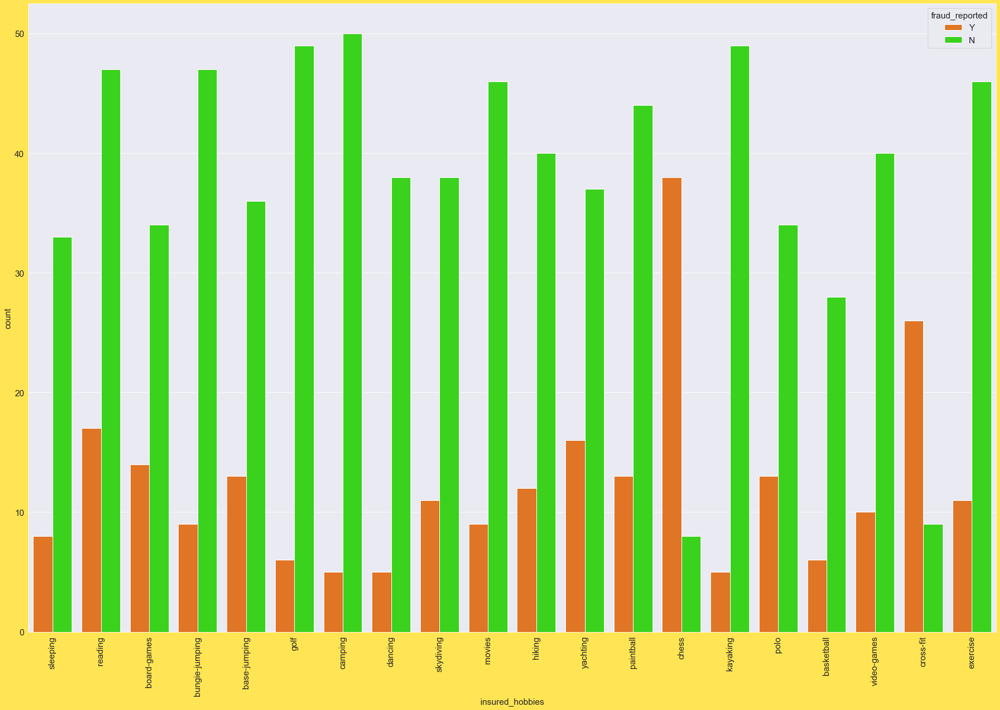

...

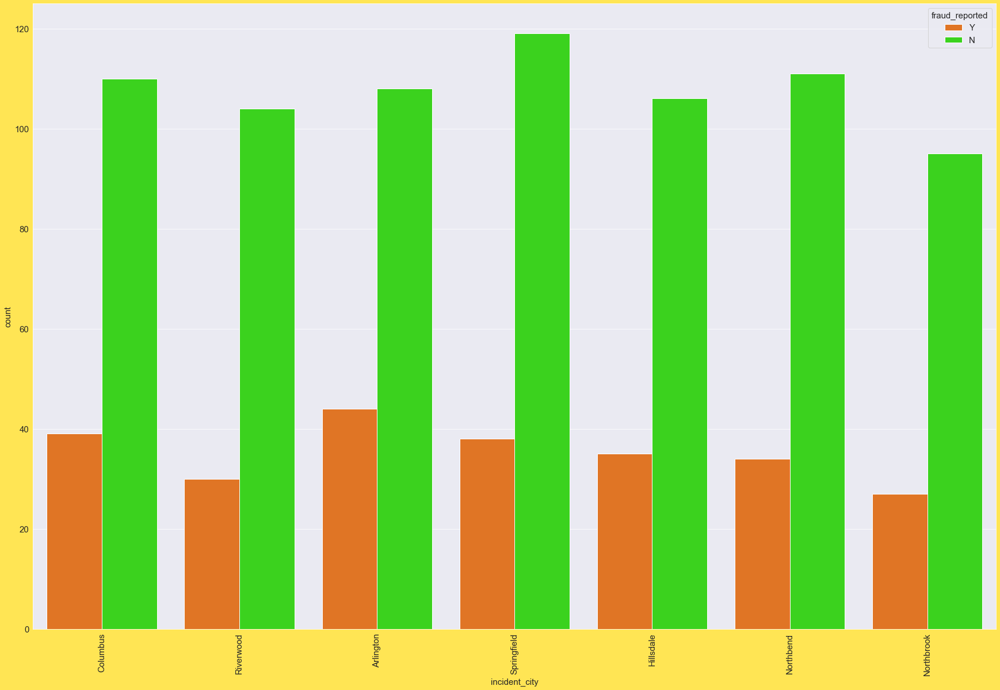

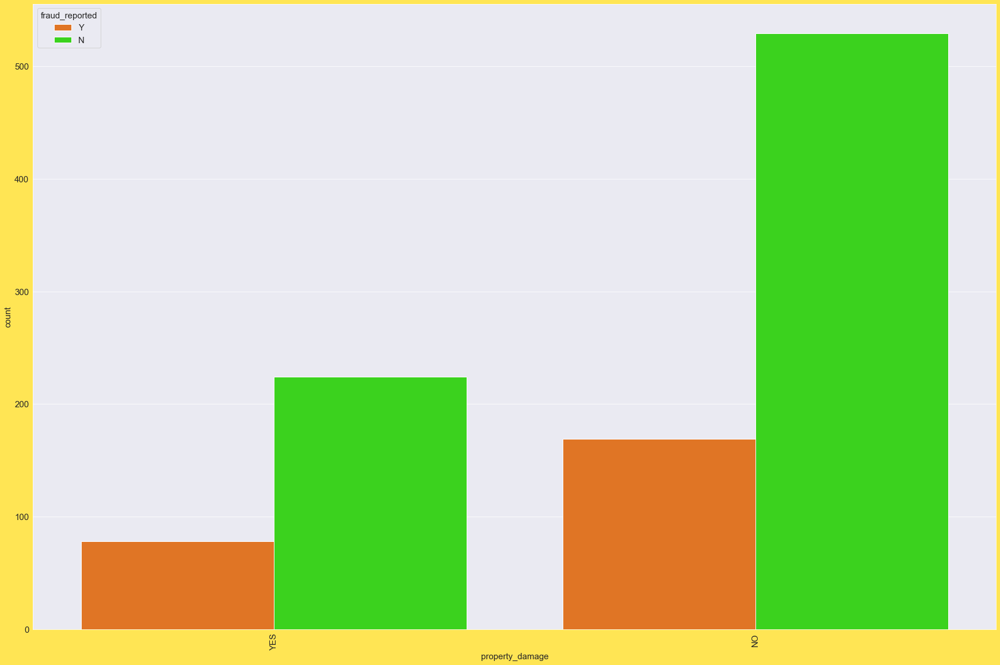

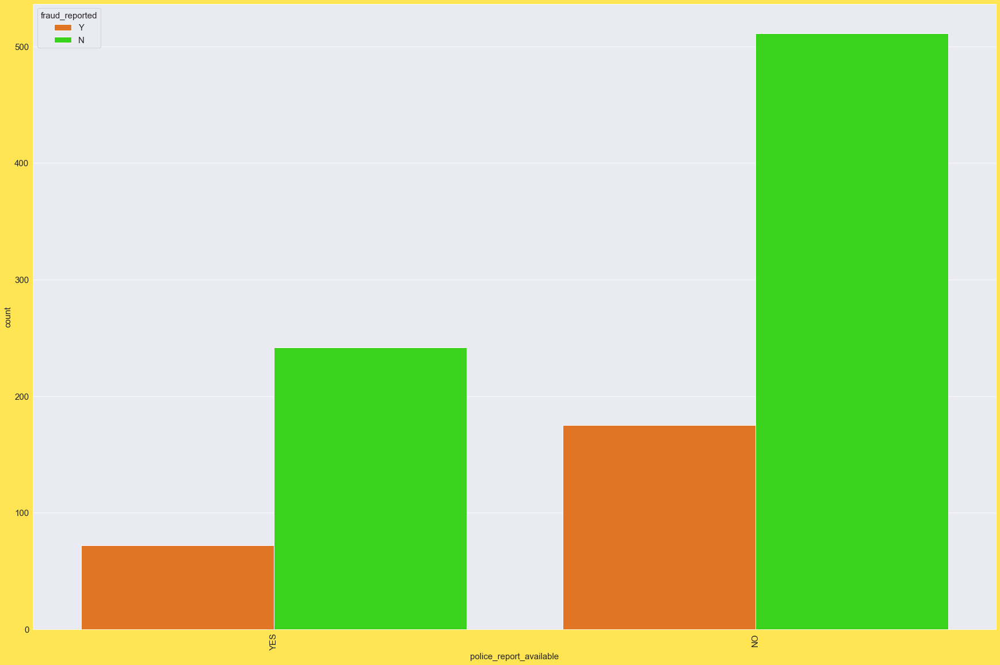

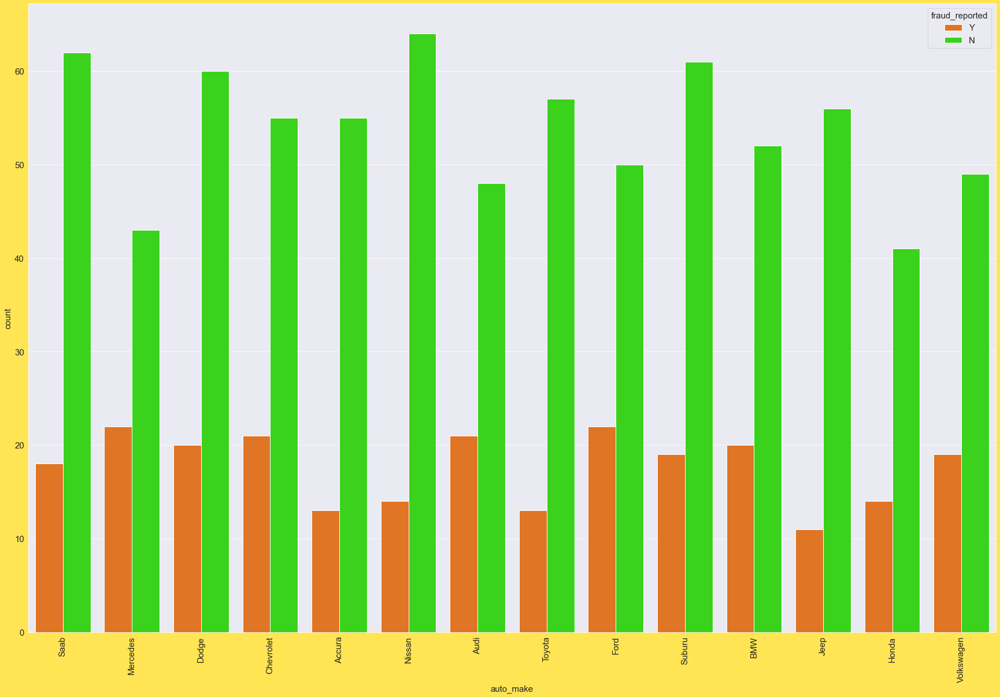

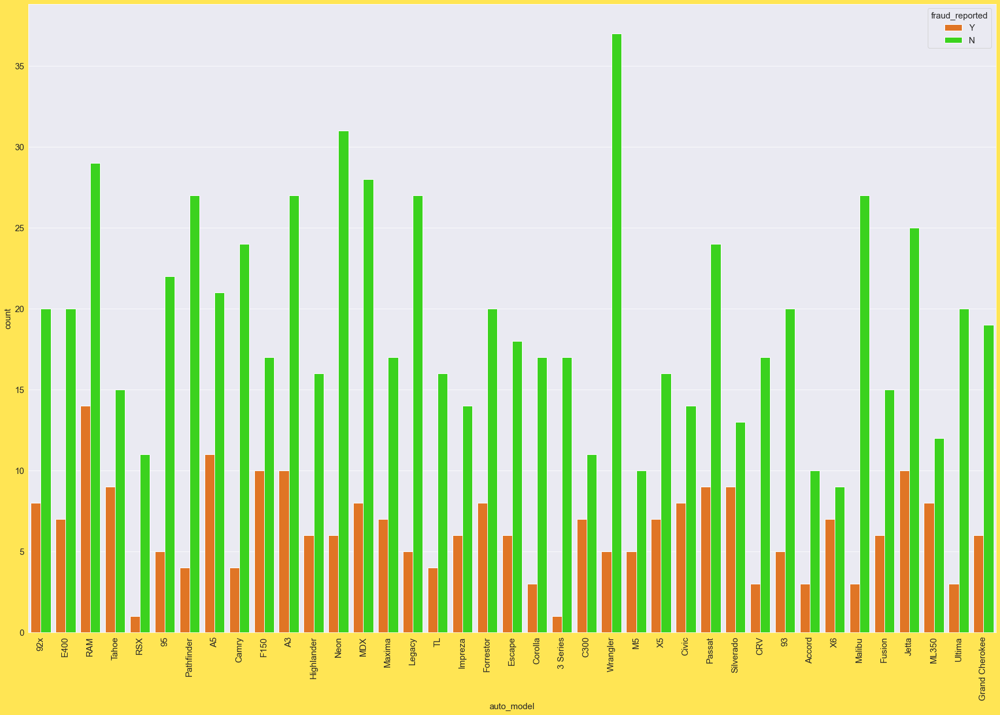

In [63]:
# plotting count plot with respect to the target fraud_reported
for i in cat_cols:
    plt.figure(figsize=(30,20))
    sns.countplot(i,data=fraud,hue='fraud_reported',palette='gist_ncar_r')
    plt.xticks(rotation=90)
    plt.show()

Observations:-
    
-> Most of the frauds are reported in OH ohio.

-> Interestingly, Mostly Women are indulged in the reported frauds.

-> JD and highschool education level are subjected to more fraud.

-> People working in exec-managerial occupation are having more frauds.

-> Very Interestingly, People who plays chess as a hobbies are likely to do more frauds in the claims.

-> Similarly, If the insured relationship is other-relative most times they are fraud.

-> Single and Multi-Vehicle collision are having same amount of frauds.

-> And Rearcollision hits are more likely to make frauds.

-> In majority of the scenarios the Major damage incidents or people are highly likely to do fraud.

-> Irrespective of the authorities contacted the fraud is same for all.

-> SC SouthCarolina state has more frauds followed by NY newyork and WV.

-> Interestingly Arlington city has more fraud cases followed by Springfield and Colombus.

-> Frauds were higher when there was no property damage.

-> And same with the police report, If any police report haven't filed then it is likely to get fraud.

-> Interestingly Mercedes,Audi and ford cars have higher chance that the insurance might get fradulent. This makes sense
   because these are luxurious comapnies and the value of cars are so much high. And people will obviously try to make fraud.
    
-> Ram model car owners if they had any incident are most likely to make frauds followed by A5, A3, F150 etc.

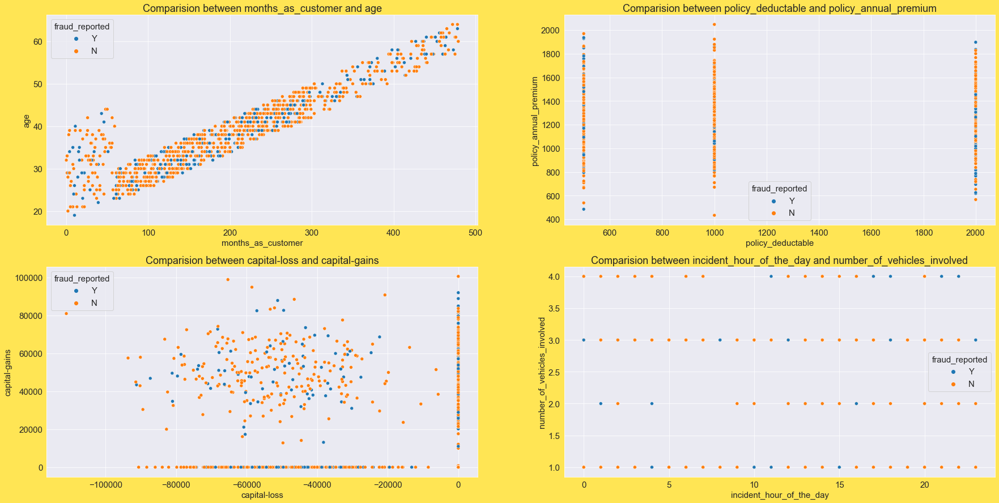

In [64]:
#Comparision between features using scatter plot
plt.figure(figsize=[30,15])

plt.subplot(2,2,1)          
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(fraud['months_as_customer'],fraud['age'],hue=fraud['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between policy_deductable and policy_annual_premium')
sns.scatterplot(fraud['policy_deductable'],fraud['policy_annual_premium'],hue=fraud['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between capital-loss and capital-gains')
sns.scatterplot(fraud['capital-loss'],fraud['capital-gains'],hue=fraud['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between incident_hour_of_the_day and number_of_vehicles_involved')
sns.scatterplot(fraud['incident_hour_of_the_day'],fraud['number_of_vehicles_involved'],hue=fraud['fraud_reported']);


-> We can see that there is a linear increase in 1st graph as the age of the person is more then the months_of_customer is also more.

-> Also in the second and 3rd plot we can't interprete any proper pattern.

-> Incident hours has no specific relation with number of vehicles invovled.

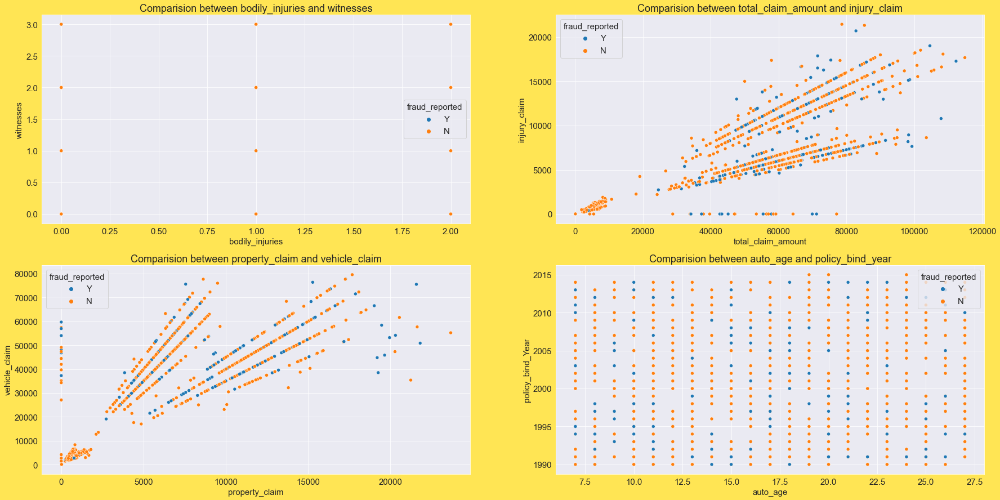

In [65]:
#Comparision between features using scatter plot
plt.figure(figsize=[30,15])

plt.subplot(2,2,1)
plt.title('Comparision between bodily_injuries and witnesses')
sns.scatterplot(fraud['bodily_injuries'],fraud['witnesses'],hue=fraud['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(fraud['total_claim_amount'],fraud['injury_claim'],hue=fraud['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(fraud['property_claim'],fraud['vehicle_claim'],hue=fraud['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between auto_age and policy_bind_year')
sns.scatterplot(fraud['auto_age'],fraud['policy_bind_Year'],hue=fraud['fraud_reported']);

-> In first plot it looks very clear that it does not have any fraud detected.

-> In second and 3rd graph it is showing linear increasing plot.i.e., as one feature increses then other feature also increses.

-> We can see that in the 4th plot do not show any proper pattern.

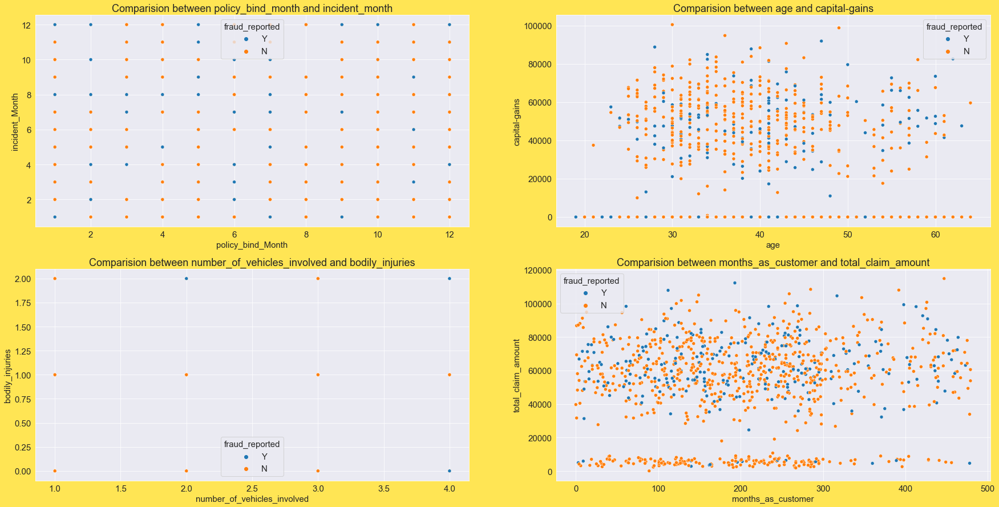

In [66]:
#Comparision between features using scatter plot
plt.figure(figsize=[30,15])

plt.subplot(2,2,1)
plt.title('Comparision between policy_bind_month and incident_month')
sns.scatterplot(fraud['policy_bind_Month'],fraud['incident_Month'],hue=fraud['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between age and capital-gains')
sns.scatterplot(fraud['age'],fraud['capital-gains'],hue=fraud['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between number_of_vehicles_involved and bodily_injuries')
sns.scatterplot(fraud['number_of_vehicles_involved'],fraud['bodily_injuries'],hue=fraud['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(fraud['months_as_customer'],fraud['total_claim_amount'],hue=fraud['fraud_reported']);

-> As evident the first graph do not show any proper pattern.

-> The age between the range 25-45 has high capital-gains.

-> In the third plot We can see that there are very less number of fraud_detected.

-> In fourth plot the points are dence near 0 claim amount and for the range of 50-300 in month_as_customer the total_claim_amount is high.

## Multivariate Analysis

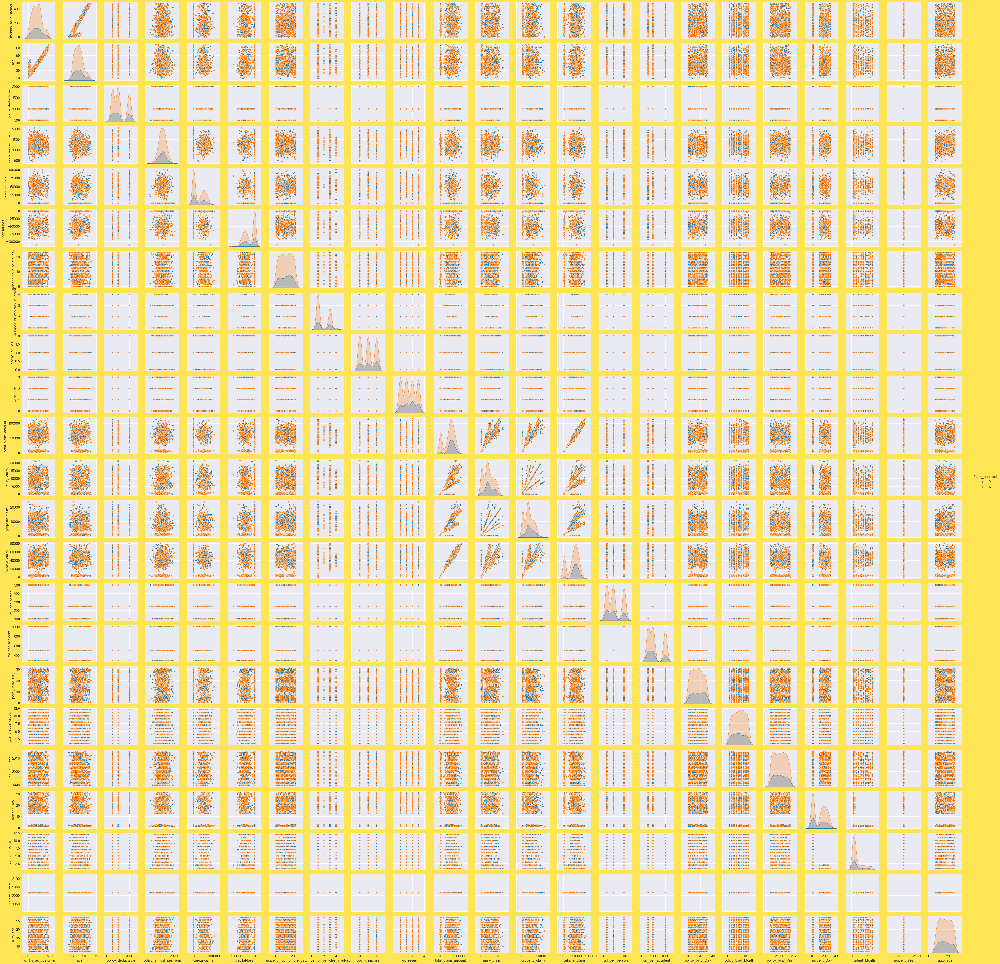

In [67]:
# plotting a pairplot to check the distribution,skeweness and correlation of each feature with the target fraud_reported
sns.pairplot(fraud,hue='fraud_reported')

## CHECKING AND TREATING OUTLIERS

In [68]:
# let's check the outliers first
cont_cols

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'csl_per_person',
 'csl_per_accident',
 'policy_bind_Day',
 'policy_bind_Month',
 'policy_bind_Year',
 'incident_Day',
 'incident_Month',
 'incident_Year',
 'auto_age']

In [69]:
#Checking for outliers using boxplot
def outlier_check(fraud,cont_cols):
    # creating a  copy of dataframe
    data = fraud[cont_cols].copy()
    # subplots 
    fig, axes = plt.subplots(nrows=len(data.columns)//2, ncols=2,figsize=(70,50))
    fig.subplots_adjust(hspace=0.7)
    
    # our main distplot
    for ax, feature in zip(axes.flatten(), data.columns):
        sns.boxplot(data[feature],ax=ax)
        ax.set_title(f'Outliers in {feature}')
    plt.show()


# We can see that there are outliers in age,policy_annual_premium,total_claim_amount,property_claim and incident_month.

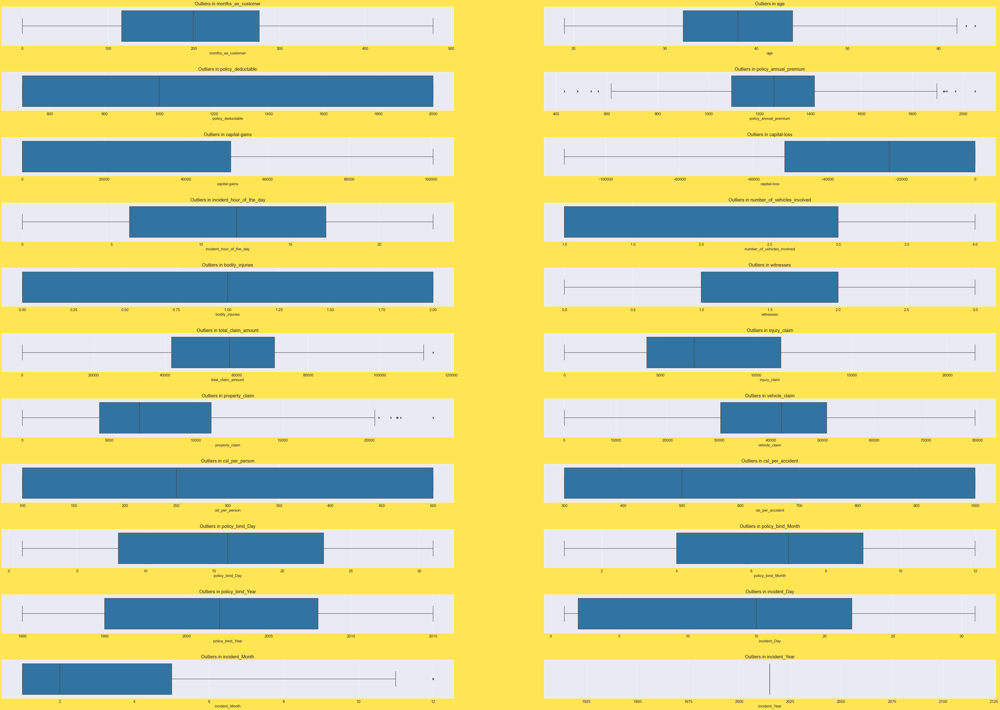

In [70]:
outlier_check(fraud,cont_cols)

In [71]:
# Let's remove outliers using zscore method first
#Features having outliers
out_cols = fraud[['age','policy_annual_premium','total_claim_amount','property_claim','incident_Month']]

In [72]:
from scipy.stats import zscore
z=np.abs(zscore(out_cols))
fraud_new = fraud[(z<3).all(axis=1)]

In [73]:
# checking the % of dataloss after removing the outliers

print("shape before and after")
print("shape before: ",fraud.shape)
print("shape after: ",fraud_new.shape)
print("Percentage Loss: ",(fraud.shape[0]-fraud_new.shape[0])/fraud.shape[0]*100)

# There is only 0.4% data loss using zscore method

shape before and after
shape before:  (1000, 40)
shape after:  (996, 40)
Percentage Loss:  0.4


In [74]:
# Now let's remove outliers using IQR method and check dataloss\
# CHECKING WITH THE iqr method as well
Q1=out_cols.quantile(0.25)
Q3=out_cols.quantile(0.75)
IQR=Q3 - Q1

fraud_quant = fraud[~((fraud < (Q1 - 1.5 * IQR)) |(fraud > (Q3 + 1.5 * IQR))).any(axis=1)]

In [75]:
# checking the % of dataloss after removing the outliers

print("shape before and after")
print("shape before: ",fraud.shape)
print("shape after: ",fraud_quant.shape)
print("Percentage Loss: ",(fraud.shape[0]-fraud_quant.shape[0])/fraud.shape[0]*100)

# We can see with IQR there is more than 5% data loss
# So we'll use zscore method

shape before and after
shape before:  (1000, 40)
shape after:  (942, 40)
Percentage Loss:  5.800000000000001


In [76]:
fraud_new.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year,auto_age
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,250,500,17,10,2014,25,1,2015,18
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,250,500,27,6,2006,21,1,2015,15
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,100,300,9,6,2000,22,2,2015,15
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,250,500,25,5,1990,1,10,2015,8
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,500,1000,6,6,2014,17,2,2015,13


## CHECKING AND TREATING SKEWNESS

In [77]:
# checking skewness
fraud_new.skew().sort_values(ascending=False)

incident_Month                 1.377097
csl_per_accident               0.609316
number_of_vehicles_involved    0.500364
capital-gains                  0.478850
age                            0.474526
policy_deductable              0.473229
csl_per_person                 0.413713
months_as_customer             0.359605
property_claim                 0.357130
injury_claim                   0.267970
policy_bind_Year               0.058499
incident_Day                   0.055659
auto_age                       0.049276
policy_annual_premium          0.032042
policy_bind_Day                0.028923
witnesses                      0.025758
bodily_injuries                0.011117
incident_Year                  0.000000
policy_bind_Month             -0.029722
incident_hour_of_the_day      -0.039123
capital-loss                  -0.393015
total_claim_amount            -0.593473
vehicle_claim                 -0.619755
dtype: float64

In [78]:
# plotting distplots to see visually
def skewness_check(fraud_new,cont_cols):
    # creating a  copy of dataframe
    data = fraud[cont_cols].copy()
    # subplots 
    fig, axes = plt.subplots(nrows=len(data.columns)//2, ncols=2,figsize=(70,50))
    fig.subplots_adjust(hspace=0.7)
    
    # our main distplot
    for ax, feature in zip(axes.flatten(), data.columns):
        sns.distplot(data[feature],ax=ax)
        ax.set_title(f'Outliers in {feature}')
    plt.show()

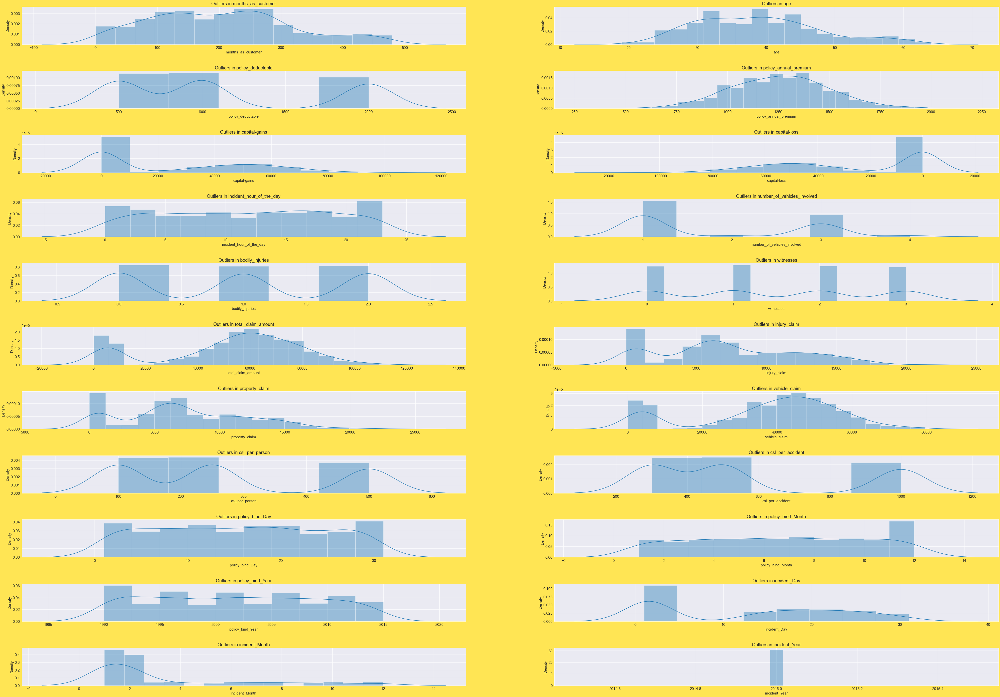

In [79]:
skewness_check(fraud_new,cont_cols)

In [80]:
# Seperating the highly skewed features
#Creating a list of skewed features
skewed_cols = ["total_claim_amount","vehicle_claim","csl_per_accident","incident_Month"]

In [81]:
# using power transformer let's remove the skewness
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [82]:
fraud_new[skewed_cols] = scaler.fit_transform(fraud_new[skewed_cols].values)

In [83]:
# checking the skewness again
fraud_new[skewed_cols].skew()

# skewness is reduced to its minimum

total_claim_amount   -0.508953
vehicle_claim        -0.521354
csl_per_accident      0.110964
incident_Month        0.305741
dtype: float64

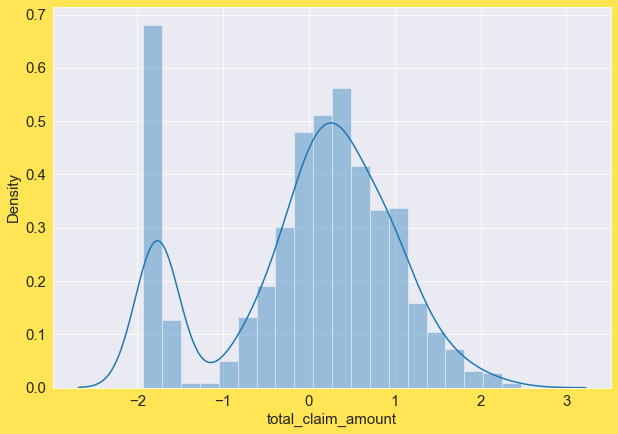

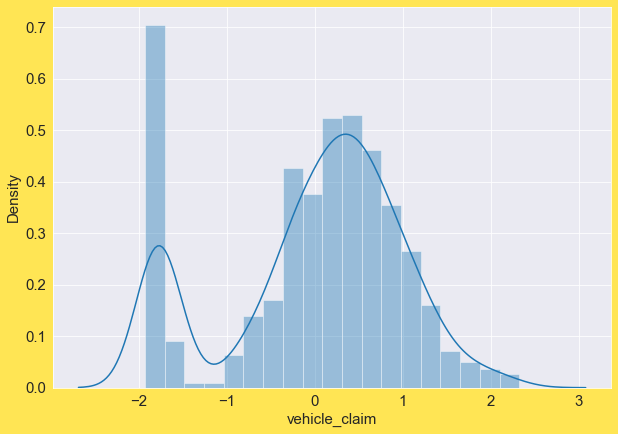

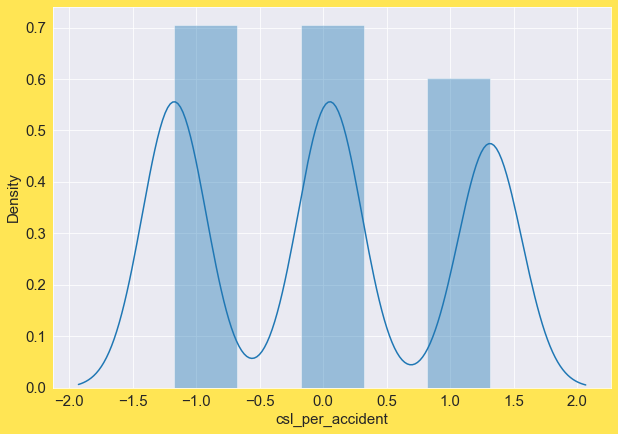

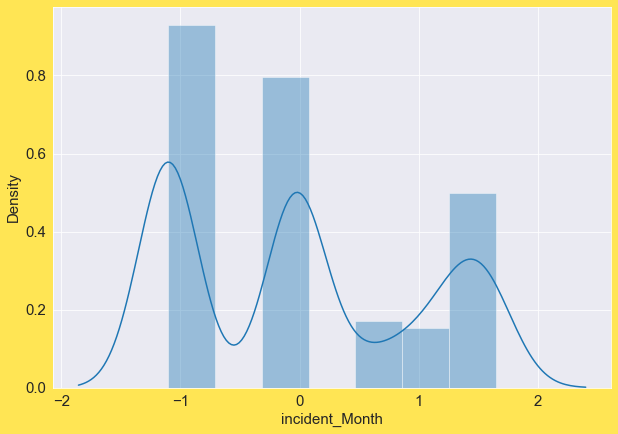

In [84]:
# checking visually again
for i in skewed_cols:
    sns.distplot(fraud_new[i])
    plt.show()
    
# We can see that skewenss has been reduced

## Encoding the features

In [85]:
# let's seperate the binary fetaures from categorical columns
binary_cat_cols = [feature for feature in cat_cols if len(fraud_new[feature].unique()) <=3]

In [86]:
binary_cat_cols

['policy_state',
 'insured_sex',
 'collision_type',
 'property_damage',
 'police_report_available']

In [87]:
fraud_new[binary_cat_cols].nunique()

policy_state               3
insured_sex                2
collision_type             3
property_damage            2
police_report_available    2
dtype: int64

In [88]:
cat_cols

['policy_state',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model']

In [89]:
# let's first encode the binary features using LabelEncoder
## Encoding the binary categorical features
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [90]:
for i in cat_cols:
    fraud_new[i] = le.fit_transform(fraud_new[i])

In [91]:
# encoding the target
fraud_new['fraud_reported'] = le.fit_transform(fraud_new['fraud_reported'])

In [92]:
fraud_new.head()

# Encoding the categorical features

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year,auto_age
0,328,48,2,1000,1406.91,1,4,2,17,0,53300,0,2,2,0,4,4,1,5,1,1,1,2,1,0.717556,6510,13020,0.754553,10,1,1,250,0.052612,17,10,2014,25,-1.101370,2015,18
1,228,42,1,2000,1197.22,1,4,6,15,2,0,0,3,1,1,4,5,5,8,1,0,0,0,0,-1.777785,780,780,-1.787353,8,12,1,250,0.052612,27,6,2006,21,-1.101370,2015,15
2,134,29,2,2000,1413.14,0,6,11,2,3,35100,0,0,1,1,4,1,1,7,3,0,2,3,0,-0.716483,7700,3850,-0.820820,4,30,0,100,-1.174021,9,6,2000,22,-0.026479,2015,15
3,256,41,0,2000,1415.74,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,0,1,2,0,0.392931,6340,6340,0.678427,3,34,1,250,0.052612,25,5,1990,1,1.553647,2015,8
4,228,44,0,1000,1583.91,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,1,0,0,1,0,-1.730555,1300,650,-1.740710,0,31,0,500,1.313327,6,6,2014,17,-0.026479,2015,13


## Correlation

In [94]:
fraud_new.corr().T

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year,auto_age
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,0.059002,-0.000848,0.005365,-0.092575,0.071097,0.007601,0.020771,-0.017202,-0.072479,-0.061932,0.011406,0.006906,-0.001837,0.068962,0.013609,0.002663,-0.011126,0.063530,-0.018760,0.064662,0.066416,0.041157,0.062392,0.049222,0.002908,0.020966,-0.022063,-0.022928,0.054175,0.004955,-0.046010,-0.013502,0.019029,NaN,-0.001287
age,0.922092,1.000000,-0.015182,0.026772,0.005890,0.072900,0.001485,0.014030,-0.080587,0.075940,-0.006333,0.008192,-0.025979,-0.075892,-0.060361,0.016000,0.007053,-0.004009,0.085509,0.021140,-0.005795,-0.017461,0.056658,-0.018493,0.070582,0.075480,0.064230,0.062165,0.032105,0.016258,0.012408,-0.012844,-0.012459,0.054465,0.015874,-0.035505,-0.008174,0.016685,NaN,-0.003268
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,0.072552,-0.032268,0.031769,0.050953,-0.026728,-0.017738,0.009195,-0.004475,0.026464,-0.043447,-0.009334,0.008992,0.024809,0.065957,-0.008788,-0.046398,0.002678,-0.000472,0.015848,-0.024513,0.028864,-0.005866,-0.000653,0.001030,0.071527,-0.005709,0.013370,0.026233,NaN,-0.002323
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,-0.011671,0.014571,-0.050024,0.005134,-0.021763,0.035950,-0.024018,-0.038696,-0.054153,-0.017352,-0.000210,0.007419,-0.046560,0.059733,0.051317,0.014131,-0.023384,0.069433,0.040969,0.025169,0.040337,0.069537,0.005902,-0.034266,-0.003597,0.015833,0.006634,0.006179,0.011204,-0.051368,-0.048465,-0.018867,-0.000169,NaN,-0.027497
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,0.041830,-0.021475,0.030963,-0.014376,0.006474,-0.009757,0.029835,0.049336,0.034999,-0.015788,-0.058852,0.049047,0.047389,-0.003001,-0.044711,0.078922,0.025323,0.006365,0.029619,0.002905,-0.024031,-0.007964,0.012961,0.011595,-0.034998,-0.010174,0.028569,0.030755,-0.030886,-0.028452,0.001650,0.016400,-0.012386,NaN,0.040439
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,1.000000,0.007473,-0.009257,-0.019600,0.004104,-0.020651,-0.024440,0.010572,-0.014399,-0.029576,0.019000,-0.021822,0.013251,0.017950,0.019275,0.025911,-0.020201,0.044173,0.009884,-0.020117,0.004603,-0.009457,-0.026816,0.026040,-0.017679,0.032173,-0.019001,-0.008959,0.045694,-0.007259,-0.031981,-0.007249,0.024223,NaN,0.028638
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,0.007473,1.000000,-0.021502,0.022806,-0.021595,0.040283,0.039890,0.012385,-0.020687,-0.007395,-0.011831,-0.006118,-0.019160,-0.057232,-0.001308,-0.048624,-0.011455,0.017577,0.054380,0.076528,0.083672,0.058663,0.070001,0.057528,0.050878,0.011520,0.011093,0.010425,0.014464,-0.007489,0.017801,-0.055411,0.069312,NaN,-0.045094
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,-0.007553,-0.021993,0.003427,0.006634,0.002255,-0.007367,-0.021531,-0.002158,-0.021308,-0.015177,-0.018839,-0.001830,-0.011373,-0.021730,0.006458,0.022693,0.008301,0.000954,0.044321,0.020878,0.003335,0.018978,0.019575,-0.003030,0.024516,-0.025282,-0.022786,0.013226,NaN,0.004827
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,-0.019600,0.022806,-0.009818,1.000000,-0.097837,0.053503,-0.032345,0.008256,0.016756,-0.023999,-0.028153,0.085633,0.018605,0.019802,0.011927,0.036599,0.030730,-0.034308,-0.030149,-0

<AxesSubplot:>

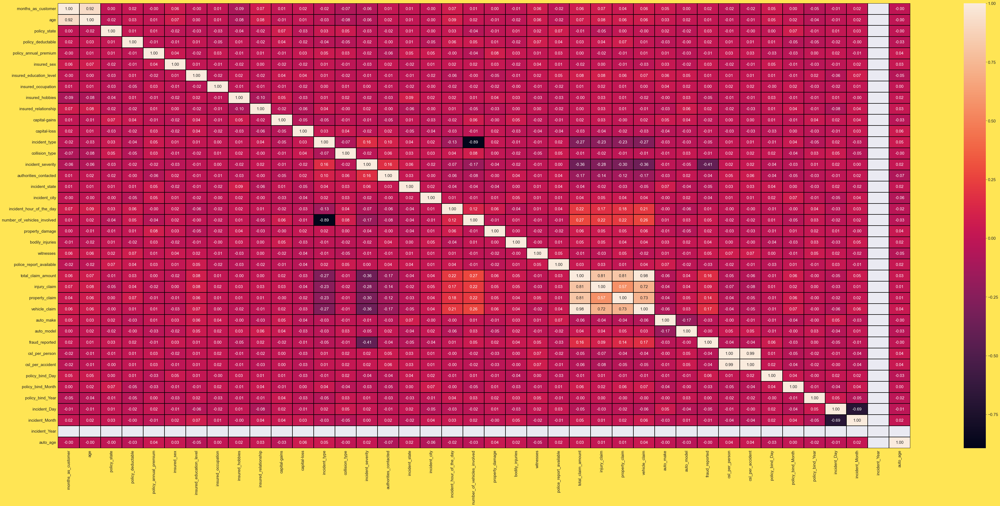

In [95]:
# plotting a heatmap
plt.figure(figsize=(70,30))
sns.heatmap(fraud_new.corr(),annot=True,linewidths=1.5,linecolor='black',fmt='.2f')

Observations:-
    
-> incident_severity has a negative correlation of 47% with the target column which can be considered as good bond

-> incident_state has a negative correlation of 8% with the target column which can be considered as weak bond

-> collision_type has a negative correlation of 7% with the target column which can be considered as weak bond

-> insured_hobbies has a negative correlation of 5% with the target column which can be considered as weak bond

-> auto_make has a negative correlation of 4% with the target column which can be considered as weak bond

-> number_of_vehicles_involved has a negative correlation of 4% with the target column which can be considered as weak bond

-> insured_education_level has a negative correlation of 4% with the target column which can be considered as weak bond

-> insured_zip has a negative correlation of 4% with the target column which can be considered as weak bond

-> incident_location has a negative correlation of 4% with the target column which can be considered as weak bond

-> incident_city has a negative correlation of 4% with the target column which can be considered as weak bond

-> age has a negative correlation of 3% with the target column which can be considered as weak bond

-> capital-gains has a negative correlation of 3% with the target column which can be considered as a weak bond

-> police_report_available has a negative correlation of 2% with the target column which can be considered as a weak bond

-> authorities_contacted has a negative correlation of 2% with the target column which can be considered as weak bond

-> capital-loss has a negative correlation of 2% with the target column which can be considered as weak bond

-> auto_model has a negative correlation of 1% with the target column which can be considered as weak bond

-> injury_claim has a negative correlation of 1% with the target column which can be considered as a weak bond

-> auto_year has a negative correlation of 0% with the target column which can be considered as a NO BOND bond

-> policy_number has a negative correlation of 0% with the target column which can be considered as a NO BOND bond

-> policy_deductable has a positive correlation of 0% with the target column which can be considered as a NO BOND bond

-> months_as_customer has a positive correlation of 0% with the target column which can be considered as a NO BOND bond

-> incident_date has a positive correlation of 0% with the target column which can be considered as a NO BOND b

In [97]:
fraud_new.corr()['fraud_reported'].sort_values()

incident_severity             -0.405287
incident_state                -0.051534
incident_Day                  -0.048187
insured_hobbies               -0.047983
incident_type                 -0.047850
authorities_contacted         -0.043676
csl_per_person                -0.042820
csl_per_accident              -0.039039
incident_city                 -0.038545
policy_bind_Month             -0.031288
auto_make                     -0.031261
police_report_available       -0.030419
capital-gains                 -0.018919
collision_type                -0.014184
capital-loss                  -0.012552
policy_annual_premium         -0.010174
incident_Month                -0.007073
auto_age                      -0.004758
auto_model                    -0.001416
policy_bind_Year               0.001029
insured_occupation             0.003335
incident_hour_of_the_day       0.005863
insured_education_level        0.011520
age                            0.012408
policy_deductable              0.015833


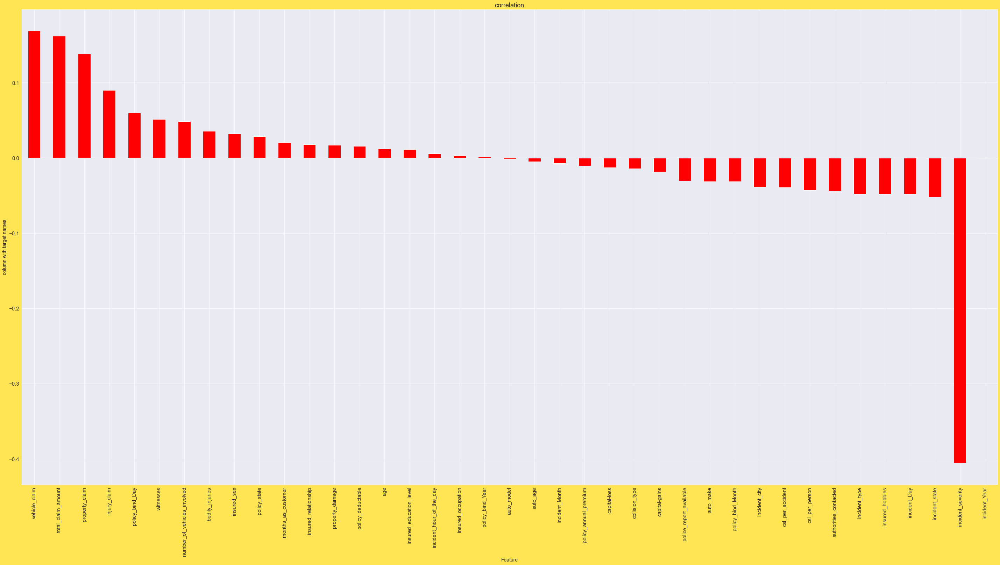

In [98]:
# plotting a barplot to see the same
# Checking the correlation of features with the target colun
plt.figure(figsize=(50,25))
fraud_new.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='red')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

-> policy_bind_year is least correlated with target variable.

-> insured_occupation and auto_model are less correlated with target column

-> auto_age and incident_hour_of_the_day also less correlated with target

## Seperating the features and target

In [100]:
x = fraud_new.drop(['fraud_reported'],axis=1)
y = fraud_new['fraud_reported']

In [101]:
# inorder to check the multicollinearity we have to scale the data
# importing StandardScaler
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x = pd.DataFrame(sc.fit_transform(x),columns=x.columns)

In [102]:
# Checking Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [103]:
# writing a function to return column names and its vif score
def vif_calc():
    vif=pd.DataFrame()
    vif["vif_Features"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    vif["Features"]=x.columns
    return vif

In [104]:
vif_calc()


,vif_Features,Features
0,6.851319,months_as_customer
1,6.855557,age
2,1.039410,policy_state
3,1.045656,policy_deductable
4,1.037450,policy_annual_premium
5,1.037410,insured_sex
6,1.047043,insured_education_level
7,1.017493,insured_occupation
8,1.052669,insured_hobbies
9,1.052965,insured_relationship


In [107]:
# removing incident_year as it is showing null value
x.drop(['incident_Year'],axis=1,inplace=True)

In [105]:
# Lets remove total_claim amount and check again
x.drop(['total_claim_amount'],axis=1,inplace=True)

In [106]:
vif_calc()

,vif_Features,Features
0,6.849523,months_as_customer
1,6.855452,age
2,1.039378,policy_state
3,1.044129,policy_deductable
4,1.036722,policy_annual_premium
5,1.034404,insured_sex
6,1.046991,insured_education_level
7,1.016776,insured_occupation
8,1.050855,insured_hobbies
9,1.052941,insured_relationship


In [109]:
x.drop(['csl_per_person'],axis=1,inplace=True)

# csl_per_person removed

# We can see now multicollinearity issue is resolved

In [110]:
vif_calc()



,vif_Features,Features
0,6.848109,months_as_customer
1,6.853750,age
2,1.038033,policy_state
3,1.043957,policy_deductable
4,1.036476,policy_annual_premium
5,1.028901,insured_sex
6,1.046977,insured_education_level
7,1.016722,insured_occupation
8,1.049220,insured_hobbies
9,1.049218,insured_relationship


# Treating imbalance data

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

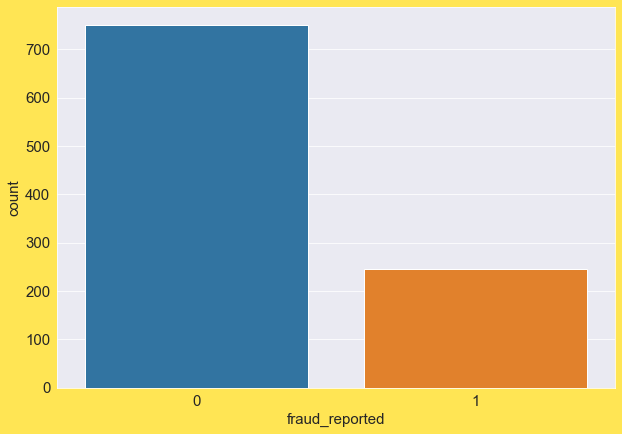

In [111]:
# Remember we have imbalance data in our target RainTomorrow
sns.countplot(y)
# We can see that there are more categories of No than Yes
# We have to balance the data

In [112]:
# Balancing the data using SMOTE by Oversampling method imported from IMBLEARN 
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

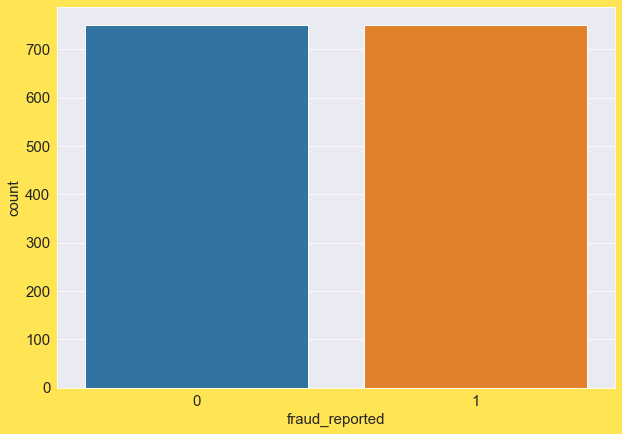

In [113]:
# checking the count again
sns.countplot(y)

# Now we can see it is balanced

## Model Building

In [114]:
# importing all the necessary models and metrics
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.linear_model import SGDClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,ExtraTreesClassifier


from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

In [115]:
# Creating instances for models
lor = LogisticRegression()
svc = SVC()
dtc = DecisionTreeClassifier()
knc = KNeighborsClassifier()
sgdc = SGDClassifier()
xgbc = XGBClassifier()
rfc = RandomForestClassifier()
abc = AdaBoostClassifier()
gbc = GradientBoostingClassifier()
etc = ExtraTreesClassifier()

In [118]:
# finding the best random state for logistic regression
lor = LogisticRegression()
for i in range(0,500):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=i)
    lor.fit(x_train,y_train)
    pred_train = lor.predict(x_train)
    pred_test = lor.predict(x_test)
    if round(accuracy_score(y_train,pred_train)*100,1) == round(accuracy_score(y_test,pred_test)*100,1):
        print('At random state',i,'The model performs very well')
        print('At random state:-',i)
        print('Training accuracy score is ', round(accuracy_score(y_train,pred_train)*100,1))
        print('Testing accuracy score is ', round(accuracy_score(y_test,pred_test)*100,1), '\n\n')

At random state 51 The model performs very well
At random state:- 51
Training accuracy score is  76.3
Testing accuracy score is  76.3 


At random state 164 The model performs very well
At random state:- 164
Training accuracy score is  75.0
Testing accuracy score is  75.0 


At random state 167 The model performs very well
At random state:- 167
Training accuracy score is  75.3
Testing accuracy score is  75.3 


At random state 173 The model performs very well
At random state:- 173
Training accuracy score is  75.7
Testing accuracy score is  75.7 


At random state 334 The model performs very well
At random state:- 334
Training accuracy score is  74.3
Testing accuracy score is  74.3 




In [228]:
# We have got 76.3 accuracy at random state 51
# At random state 51 the model performs well
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30,random_state=51)

In [120]:
# Running the model with best random state
lor.fit(x_train,y_train)
pred_train_lor = lor.predict(x_train)
pred_test_lor = lor.predict(x_test)
print('Accuracy Score of lor: ',accuracy_score(y_test,pred_test_lor))
print('\n')
print('Confusion Matrix: ',confusion_matrix(y_test,pred_test_lor))
print('\n')
print('Classification Report: ',classification_report(y_test,pred_test_lor))



Accuracy Score of lor:  0.7633333333333333


Confusion Matrix:  [[107  31]
 [ 40 122]]


Classification Report:                precision    recall  f1-score   support

           0       0.73      0.78      0.75       138
           1       0.80      0.75      0.77       162

    accuracy                           0.76       300
   macro avg       0.76      0.76      0.76       300
weighted avg       0.77      0.76      0.76       300



In [123]:
# lets check the cv score of lor
lss = accuracy_score(y_test,pred_test_lor) # creating an instance for acccuracy score
from sklearn.model_selection import cross_val_score
# running a for loop to find the best cv value which gives best score
for j in range(5,15):
    lsscore = cross_val_score(lor,x,y,cv=j)
    print(lsscore)
    lsc = lsscore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',lsc*100)
    print('accuracy_score is:- ',lss*100)
    print('\n')
    
# We can see that the cv score is almost same as the accuracy score
# So our model is running well

[0.71333333 0.72333333 0.74666667 0.72666667 0.76666667]
At cv:-  5
Cross validation score is:-  73.53333333333335
accuracy_score is:-  76.33333333333333


[0.72  0.736 0.748 0.712 0.756 0.772]
At cv:-  6
Cross validation score is:-  74.06666666666666
accuracy_score is:-  76.33333333333333


[0.71627907 0.71627907 0.78971963 0.73831776 0.70560748 0.74299065
 0.78037383]
At cv:-  7
Cross validation score is:-  74.1366783618468
accuracy_score is:-  76.33333333333333


[0.69148936 0.73404255 0.75531915 0.7606383  0.72192513 0.73262032
 0.78074866 0.75935829]
At cv:-  8
Cross validation score is:-  74.2017721014905
accuracy_score is:-  76.33333333333333


[0.68862275 0.73053892 0.73652695 0.77844311 0.74251497 0.69461078
 0.75903614 0.75903614 0.76506024]
At cv:-  9
Cross validation score is:-  73.93766683500469
accuracy_score is:-  76.33333333333333


[0.69333333 0.74666667 0.71333333 0.76666667 0.77333333 0.74666667
 0.72666667 0.72666667 0.78       0.77333333]
At cv:-  10
Cross validati

In [124]:
# selecting cv = 13
lsscore_selected = cross_val_score(lor,x,y,cv=13).mean()
print('The cv score of logistcic Regression is ',lsscore_selected,'\nThe accuracy score of logistic regression is: ',lss)

# Accuracy is  76% for LOR

The cv score of logistcic Regression is  0.746713181870603 
The accuracy score of logistic regression is:  0.7633333333333333


## DecisionTreeClassifier

In [125]:
# creating a parameter grid to search best parameter using GridSearchCV
paramgrid_dtc = {'criterion':["gini", "entropy", "log_loss"],'splitter':["best", "random"],'min_samples_split':[2,3,4,5,6,7,8],'min_samples_leaf':[0.5,1,1.5,2,2.5,3,3.5,4]}
print(paramgrid_dtc)

{'criterion': ['gini', 'entropy', 'log_loss'], 'splitter': ['best', 'random'], 'min_samples_split': [2, 3, 4, 5, 6, 7, 8], 'min_samples_leaf': [0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]}


In [126]:
dtc_search = GridSearchCV(dtc,param_grid=paramgrid_dtc,error_score='raise')

In [127]:
# fitting the GRid to training data
dtc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'min_samples_leaf': [0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4],
                         'min_samples_split': [2, 3, 4, 5, 6, 7, 8],
                         'splitter': ['best', 'random']})

In [128]:
print(dtc_search.best_score_) # bestscore
print(dtc_search.best_estimator_)
print(dtc_search.best_params_) # best params 

0.8616666666666666
DecisionTreeClassifier(criterion='entropy', min_samples_split=3)
{'criterion': 'entropy', 'min_samples_leaf': 1, 'min_samples_split': 3, 'splitter': 'best'}


In [130]:
# running the model using best parameters
dtc = DecisionTreeClassifier(criterion='entropy',splitter='best',min_samples_leaf=1,min_samples_split=3) 
# using the best parameters
dtc.fit(x_train,y_train)
pred_dtc_test= dtc.predict(x_test)
pred_dtc_train = dtc.predict(x_train)
print('Training score of dtc',accuracy_score(pred_dtc_train,y_train))
print('Accuracy Score of dtc',accuracy_score(pred_dtc_test,y_test))
print('Confusion Matrix of dtc',confusion_matrix(pred_dtc_test,y_test))
print('Classification report of Dtc',classification_report(pred_dtc_test,y_test))
print('\n')


# getting 83% with dtc

Training score of dtc 1.0
Accuracy Score of dtc 0.8333333333333334
Confusion Matrix of dtc [[116  28]
 [ 22 134]]
Classification report of Dtc               precision    recall  f1-score   support

           0       0.84      0.81      0.82       144
           1       0.83      0.86      0.84       156

    accuracy                           0.83       300
   macro avg       0.83      0.83      0.83       300
weighted avg       0.83      0.83      0.83       300





In [131]:
# Checking the cross validation of dtc
dtca = accuracy_score(pred_dtc_test,y_test)
for j in range(5,15):
    dtcscore = cross_val_score(dtc,x,y,cv=j)
    print(dtcscore)
    dsc = dtcscore.mean()
    print('At cv:- ',j)
    print('Cross validation score of DTC is:- ',dsc*100)
    print('accuracy_score of DTC is:- ',dtca*100)
    print('\n')

[0.70333333 0.84       0.85333333 0.92       0.88      ]
At cv:-  5
Cross validation score of DTC is:-  83.93333333333335
accuracy_score of DTC is:-  83.33333333333334


[0.724 0.748 0.884 0.876 0.912 0.876]
At cv:-  6
Cross validation score of DTC is:-  83.66666666666667
accuracy_score of DTC is:-  83.33333333333334


[0.69302326 0.78139535 0.8411215  0.86448598 0.88317757 0.90186916
 0.85514019]
At cv:-  7
Cross validation score of DTC is:-  83.1458999596361
accuracy_score of DTC is:-  83.33333333333334


[0.70744681 0.76595745 0.82446809 0.88297872 0.85026738 0.87700535
 0.95187166 0.86096257]
At cv:-  8
Cross validation score of DTC is:-  84.01197519626807
accuracy_score of DTC is:-  83.33333333333334


[0.70658683 0.77844311 0.80239521 0.86826347 0.84431138 0.86227545
 0.93373494 0.92168675 0.87349398]
At cv:-  9
Cross validation score of DTC is:-  84.34656790835999
accuracy_score of DTC is:-  83.33333333333334


[0.76       0.73333333 0.77333333 0.8        0.91333333 0.83333333
 

In [132]:
# the cv score at 7 and accuracy score is almost same, so we can say that the model is working well
# cv= 7 for DecisionTree
dtcscore_selected = cross_val_score(dtc,x,y,cv=7).mean()
print('The cv score of DecisionTree is ',dtcscore_selected,'\nThe accuracy score of DecisionTree is: ',dtca)

# DTC =  83%

The cv score of DecisionTree is  0.8327879032508461 
The accuracy score of DecisionTree is:  0.8333333333333334


## SupportVectorClassifier

In [229]:
# Creating parameter grid for  SVC
paramgrid_svc = {'C':[0.1,0.2,0.3],
                 'kernel':['rbf','poly','sigmoid'],
                 'degree':[3,4,5,6],'gamma':['scale','auto'],'decision_function_shape':['ovo','ovr'],'cache_size':[100,150,200,250],'shrinking':[True,False]}
print(paramgrid_svc)

{'C': [0.1, 0.2, 0.3], 'kernel': ['rbf', 'poly', 'sigmoid'], 'degree': [3, 4, 5, 6], 'gamma': ['scale', 'auto'], 'decision_function_shape': ['ovo', 'ovr'], 'cache_size': [100, 150, 200, 250], 'shrinking': [True, False]}


In [230]:
svc_search = GridSearchCV(svc,param_grid=paramgrid_svc,error_score='raise')

In [231]:
svc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise',
             estimator=SVC(C=1.5, cache_size=150,
                           decision_function_shape='ovo'),
             param_grid={'C': [0.1, 0.2, 0.3],
                         'cache_size': [100, 150, 200, 250],
                         'decision_function_shape': ['ovo', 'ovr'],
                         'degree': [3, 4, 5, 6], 'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'sigmoid'],
                         'shrinking': [True, False]})

In [232]:
print(svc_search.best_score_)
print(svc_search.best_estimator_)
print(svc_search.best_params_) # best params

0.8314285714285715
SVC(C=0.3, cache_size=100, decision_function_shape='ovo', degree=6,
    kernel='poly')
{'C': 0.3, 'cache_size': 100, 'decision_function_shape': 'ovo', 'degree': 6, 'gamma': 'scale', 'kernel': 'poly', 'shrinking': True}


In [233]:
# running the model using the best params
svc = SVC(C=1.5,degree=3,gamma='scale',kernel='rbf',cache_size=150,decision_function_shape='ovo',shrinking=True) # using the best parameters
svc.fit(x_train,y_train)
pred_svc_test= svc.predict(x_test)
pred_svc_train = svc.predict(x_train)
print('Training score of svc',accuracy_score(pred_svc_train,y_train))
print('Accuracy Score of svc',accuracy_score(pred_svc_test,y_test))
print('Confusion Matrix of svc',confusion_matrix(pred_svc_test,y_test))
print('Classification report of svc',classification_report(pred_svc_test,y_test))
print('\n')

# We are getting around 91% accuracy with SVC

Training score of svc 0.9828571428571429
Accuracy Score of svc 0.86
Confusion Matrix of svc [[190  30]
 [ 33 197]]
Classification report of svc               precision    recall  f1-score   support

           0       0.85      0.86      0.86       220
           1       0.87      0.86      0.86       230

    accuracy                           0.86       450
   macro avg       0.86      0.86      0.86       450
weighted avg       0.86      0.86      0.86       450





In [234]:
# checking the cv score for SVC
svca = accuracy_score(y_test,pred_svc_test) 
for j in range(5,10):
    svccore = cross_val_score(svc,x,y,cv=j)
    print(svccore)
    svcc = svccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',svcc*100)
    print('accuracy_score is:- ',svca*100)
    print('\n') # cv and accuracy is almost same

[0.82       0.87333333 0.91       0.88666667 0.93666667]
At cv:-  5
Cross validation score is:-  88.53333333333333
accuracy_score is:-  86.0


[0.812 0.856 0.928 0.876 0.924 0.944]
At cv:-  6
Cross validation score is:-  89.0
accuracy_score is:-  86.0


[0.8        0.85116279 0.92056075 0.91588785 0.88317757 0.91588785
 0.93925234]
At cv:-  7
Cross validation score is:-  88.94184494054088
accuracy_score is:-  86.0


[0.79787234 0.85106383 0.86702128 0.94148936 0.88770053 0.89839572
 0.93582888 0.94117647]
At cv:-  8
Cross validation score is:-  89.00685515985892
accuracy_score is:-  86.0


[0.79640719 0.84431138 0.83832335 0.94610778 0.91616766 0.88023952
 0.93975904 0.91566265 0.95180723]
At cv:-  9
Cross validation score is:-  89.20873113211327
accuracy_score is:-  86.0




In [235]:
# selecting cv = 4
svcscore_selected = cross_val_score(svc,x,y,cv=4).mean()
print('The cv score of SVC is ',svcscore_selected,'\nThe accuracy score of SVC is: ',svca)


# 91% from SVC

The cv score of SVC is  0.8806666666666666 
The accuracy score of SVC is:  0.86


## KNeighborsClassifier

In [142]:
# paragrid for KNC
paramgrid_knc = {'n_neighbors':[x for x in range(5,10)],'algorithm':['auto','ball_tree','kd_tree'],
                 'leaf_size':[l for l in range(30,36)],'p':[2,3,4,6]}
# writing a list comprehension for leaf_size and n_neighbors instead of writing all the values

In [143]:
knc_search = GridSearchCV(knc,param_grid=paramgrid_knc)

In [144]:
knc_search.fit(x_train,y_train)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree'],
                         'leaf_size': [30, 31, 32, 33, 34, 35],
                         'n_neighbors': [5, 6, 7, 8, 9], 'p': [2, 3, 4, 6]})

In [145]:
# getting the best params and score
print(knc_search.best_score_)
print(knc_search.best_estimator_)
print(knc_search.best_params_)

0.6758333333333333
KNeighborsClassifier(n_neighbors=6)
{'algorithm': 'auto', 'leaf_size': 30, 'n_neighbors': 6, 'p': 2}


In [146]:
# running the model using the best params
knc = KNeighborsClassifier(algorithm='auto',leaf_size=30,n_neighbors=6,p=2) # using the best parameters
knc.fit(x_train,y_train)
pred_knc_test= knc.predict(x_test)
pred_knc_train = knc.predict(x_train)
print('Training score of knc: ',accuracy_score(pred_knc_train,y_train))
print('Accuracy Score of knc: ',accuracy_score(pred_knc_test,y_test))
print('Confusion Matrix of knc: ',confusion_matrix(pred_knc_test,y_test))
print('Classification report of knc: ',classification_report(pred_knc_test,y_test))
print('\n')

# getting 74% accuracy

Training score of knc:  0.7841666666666667
Accuracy Score of knc:  0.7433333333333333
Confusion Matrix of knc:  [[ 70   9]
 [ 68 153]]
Classification report of knc:                precision    recall  f1-score   support

           0       0.51      0.89      0.65        79
           1       0.94      0.69      0.80       221

    accuracy                           0.74       300
   macro avg       0.73      0.79      0.72       300
weighted avg       0.83      0.74      0.76       300





In [149]:
# checking the cv score
knca = accuracy_score(y_test,pred_knc_test) 
for j in range(5,15):
    knccore = cross_val_score(knc,x,y,cv=j)
    print(knccore)
    kncc = knccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',kncc*100)
    print('accuracy_score is:- ',knca*100)
    print('\n') # cv and accuracy is almost same

[0.65666667 0.66666667 0.73333333 0.75666667 0.73333333]
At cv:-  5
Cross validation score is:-  70.93333333333334
accuracy_score is:-  74.33333333333333


[0.644 0.64  0.724 0.736 0.744 0.736]
At cv:-  6
Cross validation score is:-  70.39999999999999
accuracy_score is:-  74.33333333333333


[0.65116279 0.63255814 0.70560748 0.74299065 0.75233645 0.72429907
 0.73364486]
At cv:-  7
Cross validation score is:-  70.60856335579221
accuracy_score is:-  74.33333333333333


[0.65425532 0.70212766 0.62765957 0.7287234  0.73796791 0.73262032
 0.71122995 0.73262032]
At cv:-  8
Cross validation score is:-  70.34005575150756
accuracy_score is:-  74.33333333333333


[0.64071856 0.69461078 0.61676647 0.73652695 0.74251497 0.71856287
 0.72891566 0.74096386 0.72891566]
At cv:-  9
Cross validation score is:-  70.53884199472542
accuracy_score is:-  74.33333333333333


[0.65333333 0.7        0.61333333 0.72       0.71333333 0.70666667
 0.77333333 0.7        0.74666667 0.74      ]
At cv:-  10
Cross valida

In [150]:
# selecting cv = 13 and we are getting accuracy and cv score almost same , which means our model is working well
kncscore_selected = cross_val_score(knc,x,y,cv=13).mean()
print('The cv score of KNeighborsC is ',kncscore_selected,'\nThe accuracy score of KNeighborsC is: ',knca)

# 74% accuracy from KNeighborsC

The cv score of KNeighborsC is  0.7141448506515972 
The accuracy score of KNeighborsC is:  0.7433333333333333


## SGDClassifier

In [151]:
parametergrid_sgdc = {'loss':['hinge','log_loss','log','modified_huber','squared_hinge'],
                     'penalty':['l2','l1','elasticnet'],'alpha':[0.1,.001,0.0001,1,10],'max_iter':[1000,1200,1500],
                     'l1_ratio':[0.15,0.30,0.75]}

In [152]:
sgdc_search = GridSearchCV(sgdc,param_grid=parametergrid_sgdc)

In [153]:
# fitting the cv to train data
sgdc_search.fit(x_train,y_train)

GridSearchCV(estimator=SGDClassifier(),
             param_grid={'alpha': [0.1, 0.001, 0.0001, 1, 10],
                         'l1_ratio': [0.15, 0.3, 0.75],
                         'loss': ['hinge', 'log_loss', 'log', 'modified_huber',
                                  'squared_hinge'],
                         'max_iter': [1000, 1200, 1500],
                         'penalty': ['l2', 'l1', 'elasticnet']})

In [154]:
# getting best prams 
print(sgdc_search.best_score_)
print(sgdc_search.best_estimator_)
print(sgdc_search.best_params_)

0.7833333333333333
SGDClassifier(alpha=1, loss='modified_huber', penalty='elasticnet')
{'alpha': 1, 'l1_ratio': 0.15, 'loss': 'modified_huber', 'max_iter': 1000, 'penalty': 'elasticnet'}


In [162]:
# running the model using the best params
sgdc = SGDClassifier(alpha=1,loss='modified_huber',max_iter=1000,penalty='elasticnet',l1_ratio=0.15) # using the best parameters
sgdc.fit(x_train,y_train)
pred_sgdc_test= sgdc.predict(x_test)
pred_sgdc_train = sgdc.predict(x_train)
print('Training score of SGDClassifier: ',accuracy_score(pred_sgdc_train,y_train))
print('Accuracy Score of SGDClassifier: ',accuracy_score(pred_sgdc_test,y_test))
print('Confusion Matrix of SGDClassifier: ',confusion_matrix(pred_sgdc_test,y_test))
print('Classification report of SGDClassifier: ',classification_report(pred_sgdc_test,y_test))
print('\n')

# sgdc is giving 76%

Training score of SGDClassifier:  0.7885714285714286
Accuracy Score of SGDClassifier:  0.76
Confusion Matrix of SGDClassifier:  [[193  78]
 [ 30 149]]
Classification report of SGDClassifier:                precision    recall  f1-score   support

           0       0.87      0.71      0.78       271
           1       0.66      0.83      0.73       179

    accuracy                           0.76       450
   macro avg       0.76      0.77      0.76       450
weighted avg       0.78      0.76      0.76       450





In [163]:
# checking the cv score
sgdca = accuracy_score(y_test,pred_sgdc_test) 
for j in range(5,11):
    sgdccore = cross_val_score(sgdc,x,y,cv=j)
    print(sgdccore)
    sgdcc = sgdccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',sgdcc*100)
    print('accuracy_score is:- ',sgdca*100)
    print('\n') # cv and accuracy is almost same

[0.75666667 0.76333333 0.73       0.78       0.82333333]
At cv:-  5
Cross validation score is:-  77.06666666666668
accuracy_score is:-  76.0


[0.764 0.716 0.712 0.696 0.82  0.812]
At cv:-  6
Cross validation score is:-  75.33333333333333
accuracy_score is:-  76.0


[0.72093023 0.73953488 0.72429907 0.72897196 0.74766355 0.8271028
 0.75233645]
At cv:-  7
Cross validation score is:-  74.86912782935387
accuracy_score is:-  76.0


[0.69148936 0.69680851 0.7287234  0.73404255 0.70053476 0.77540107
 0.80748663 0.80748663]
At cv:-  8
Cross validation score is:-  74.27466150870407
accuracy_score is:-  76.0


[0.75449102 0.75449102 0.78443114 0.78443114 0.70658683 0.68263473
 0.77710843 0.80722892 0.75301205]
At cv:-  9
Cross validation score is:-  75.60461406504263
accuracy_score is:-  76.0


[0.76       0.69333333 0.76       0.72666667 0.81333333 0.70666667
 0.76       0.8        0.83333333 0.74666667]
At cv:-  10
Cross validation score is:-  76.0
accuracy_score is:-  76.0




In [164]:
# selecting cv = 9
sgdcscore_selected = cross_val_score(sgdc,x,y,cv=9).mean()
print('The cv score of SGDClassifier is ',sgdcscore_selected,'\nThe accuracy score of SGDClassifier is: ',sgdca)

# % with sgdc and cv score is almost same so our model is working well
# getting 76% accuracy after cv

The cv score of SGDClassifier is  0.7454328291208747 
The accuracy score of SGDClassifier is:  0.76


## XGBClassifier

In [165]:
# Using XGBoostClasssifier 
# We are not doing hyperparameter tuning to this.
xgbc = XGBClassifier() 
xgbc.fit(x_train,y_train)
pred_xgbc_test= xgbc.predict(x_test)
pred_xgbc_train = xgbc.predict(x_train)
print('Training score of SGDClassifier: ',accuracy_score(pred_xgbc_train,y_train))
print('Accuracy Score of SGDClassifier: ',accuracy_score(pred_xgbc_test,y_test))
print('Confusion Matrix of SGDClassifier: ',confusion_matrix(pred_xgbc_test,y_test))
print('Classification report of SGDClassifier: ',classification_report(pred_xgbc_test,y_test))
print('\n')

#getting 88% accuracy with XGBoostClassifier

Training score of SGDClassifier:  1.0
Accuracy Score of SGDClassifier:  0.8866666666666667
Confusion Matrix of SGDClassifier:  [[194  22]
 [ 29 205]]
Classification report of SGDClassifier:                precision    recall  f1-score   support

           0       0.87      0.90      0.88       216
           1       0.90      0.88      0.89       234

    accuracy                           0.89       450
   macro avg       0.89      0.89      0.89       450
weighted avg       0.89      0.89      0.89       450





In [166]:
# checking the cv score
xgbca = accuracy_score(y_test,pred_xgbc_test) 
for j in range(5,15):
    xgbccore = cross_val_score(xgbc,x,y,cv=j)
    print(xgbccore)
    xgbcc = xgbccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',xgbcc*100)
    print('accuracy_score is:- ',xgbca*100)
    print('\n') # cv and accuracy is almost same

[0.74       0.86       0.92333333 0.94       0.93      ]
At cv:-  5
Cross validation score is:-  87.86666666666667
accuracy_score is:-  88.66666666666667


[0.792 0.816 0.932 0.908 0.956 0.932]
At cv:-  6
Cross validation score is:-  88.93333333333334
accuracy_score is:-  88.66666666666667


[0.78139535 0.80465116 0.90186916 0.92990654 0.90186916 0.96261682
 0.92056075]
At cv:-  7
Cross validation score is:-  88.61241345049214
accuracy_score is:-  88.66666666666667


[0.78191489 0.81914894 0.86702128 0.94148936 0.90374332 0.93048128
 0.96791444 0.9197861 ]
At cv:-  8
Cross validation score is:-  89.14374502218682
accuracy_score is:-  88.66666666666667


[0.78443114 0.78443114 0.83832335 0.91017964 0.94610778 0.89820359
 0.95783133 0.95783133 0.92771084]
At cv:-  9
Cross validation score is:-  88.94500156313879
accuracy_score is:-  88.66666666666667


[0.81333333 0.78       0.8        0.9        0.93333333 0.9
 0.91333333 0.97333333 0.97333333 0.92666667]
At cv:-  10
Cross validation sc

In [167]:
# selecting cv = 5
xgbcscore_selected = cross_val_score(xgbc,x,y,cv=5).mean()
print('The cv score of XGBClassifier is ',xgbcscore_selected,'\nThe accuracy score of XGBClassifier is: ',xgbca)

# % with sgdc and cv score is almost same so our model is working well
# getting 88% accuracy after cv

The cv score of XGBClassifier is  0.8786666666666667 
The accuracy score of XGBClassifier is:  0.8866666666666667


# Ensemeble Methods

## RandomForestClassifier

In [168]:
# framing the parameters
# no of trees in random forest
n_estimators = [int(x) for x in range(100,300,50)]

# method of measuring the quality of split 
criterion = ['gini','entropy','log_loss']

# features to consider for best split
max_features = ["sqrt", "log2", None]

# max depth of the tree
max_depth = [2,4,6]

min_samples_split = [2,5,7,3,4]

min_samples_leaf = [2,3,4,5]

class_weight = ["balanced", "balanced_subsample"]

bootstrap = [True,False]

In [169]:
# creating the paramgrid
param_grid = {'n_estimators':n_estimators,
             'criterion':criterion,
             'max_features':max_features,
             'max_depth':max_depth,
             'class_weight':class_weight,
             'bootstrap':bootstrap}
print(param_grid)

{'n_estimators': [100, 150, 200, 250], 'criterion': ['gini', 'entropy', 'log_loss'], 'max_features': ['sqrt', 'log2', None], 'max_depth': [2, 4, 6], 'class_weight': ['balanced', 'balanced_subsample'], 'bootstrap': [True, False]}


In [170]:
rfc_search = GridSearchCV(rfc,param_grid=param_grid,error_score='raise')

In [171]:
rfc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False],
                         'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 4, 6],
                         'max_features': ['sqrt', 'log2', None],
                         'n_estimators': [100, 150, 200, 250]})

In [172]:
print(rfc_search.best_score_)
print(rfc_search.best_estimator_)
print(rfc_search.best_params_) # we got the best score and best params

0.8838095238095238
RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy',
                       max_depth=6, max_features=None)
{'bootstrap': True, 'class_weight': 'balanced_subsample', 'criterion': 'entropy', 'max_depth': 6, 'max_features': None, 'n_estimators': 100}


In [175]:
# running the model using the best params
rfc = RandomForestClassifier(criterion='entropy',max_depth=6, max_features=None,n_estimators=100,bootstrap=True,class_weight='balanced_subsample') # using the best parameters
rfc.fit(x_train,y_train)
pred_rfc_test= rfc.predict(x_test)
pred_rfc_train = rfc.predict(x_train)

print('Training score of RandomForestClassifier: ',accuracy_score(pred_rfc_train,y_train))
print('Accuracy Score of RandomForestClassifier: ',accuracy_score(pred_rfc_test,y_test))
print('Confusion Matrix of RandomForestClassifier: ',confusion_matrix(pred_rfc_test,y_test))
print('Classification report of RandomForestClassifier: ',classification_report(pred_rfc_test,y_test))
print('\n')

# getting 85% accuracy

Training score of RandomForestClassifier:  0.9266666666666666
Accuracy Score of RandomForestClassifier:  0.8511111111111112
Confusion Matrix of RandomForestClassifier:  [[188  32]
 [ 35 195]]
Classification report of RandomForestClassifier:                precision    recall  f1-score   support

           0       0.84      0.85      0.85       220
           1       0.86      0.85      0.85       230

    accuracy                           0.85       450
   macro avg       0.85      0.85      0.85       450
weighted avg       0.85      0.85      0.85       450





In [176]:
# checking the cv score
rfca = accuracy_score(y_test,pred_rfc_test) 
for j in range(5,10):
    rfccore = cross_val_score(rfc,x,y,cv=j)
    print(rfccore)
    rfcc = rfccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',rfcc*100)
    print('accuracy_score is:- ',rfca*100)
    print('\n') # cv and accuracy is almost same

[0.82       0.87       0.87       0.89       0.88666667]
At cv:-  5
Cross validation score is:-  86.73333333333333
accuracy_score is:-  85.11111111111111


[0.84  0.884 0.856 0.848 0.916 0.884]
At cv:-  6
Cross validation score is:-  87.13333333333334
accuracy_score is:-  85.11111111111111


[0.82790698 0.88837209 0.85514019 0.88317757 0.85046729 0.92990654
 0.86915888]
At cv:-  7
Cross validation score is:-  87.20185052938803
accuracy_score is:-  85.11111111111111


[0.82978723 0.87765957 0.87765957 0.85638298 0.85026738 0.88235294
 0.93582888 0.86096257]
At cv:-  8
Cross validation score is:-  87.13626408010012
accuracy_score is:-  85.11111111111111


[0.82634731 0.88622754 0.88622754 0.84431138 0.88622754 0.83832335
 0.92168675 0.91566265 0.86144578]
At cv:-  9
Cross validation score is:-  87.40510945979527
accuracy_score is:-  85.11111111111111




In [177]:
# selecting cv = 4 
# we are getting the cv score and accuracy almost same so our model is working well
rfcscore_selected = cross_val_score(rfc,x,y,cv=4).mean()
print('The cv score of RandomForestClassifier is ',rfcscore_selected,'\nThe accuracy score of RandomForestClassifier is: ',rfca)
# getting 85% with rfc

The cv score of RandomForestClassifier is  0.8673333333333333 
The accuracy score of RandomForestClassifier is:  0.8511111111111112


## AdaBoostClassifier

In [178]:
parametergrid_abc = {'n_estimators':[x for x in range(50,61)],'algorithm':['SAMME','SAMME.R'],'learning_rate':[0.5,1.0,1.5]}

In [179]:
abc_search = GridSearchCV(abc,param_grid=parametergrid_abc,error_score='raise')

In [180]:
abc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=AdaBoostClassifier(),
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.5, 1.0, 1.5],
                         'n_estimators': [50, 51, 52, 53, 54, 55, 56, 57, 58,
                                          59, 60]})

In [181]:
print(abc_search.best_score_)
print(abc_search.best_estimator_)
print(abc_search.best_params_) # we got the best score and best params

0.8847619047619049
AdaBoostClassifier(algorithm='SAMME', n_estimators=60)
{'algorithm': 'SAMME', 'learning_rate': 1.0, 'n_estimators': 60}


In [183]:
# running the model using the best params
abc = AdaBoostClassifier(algorithm='SAMME.R',learning_rate=1.0,n_estimators=60) # using the best parameters
abc.fit(x_train,y_train)
pred_abc_test= abc.predict(x_test)
pred_abc_train = abc.predict(x_train)
print('Training score of AdaBoostClassifier: ',accuracy_score(pred_abc_train,y_train))
print('Accuracy Score of AdaBoostClassifier: ',accuracy_score(pred_abc_test,y_test))
print('Confusion Matrix of AdaBoostClassifier: ',confusion_matrix(pred_abc_test,y_test))
print('Classification report of AdaBoostClassifier: ',classification_report(pred_abc_test,y_test))
print('\n')

# we are getting 84% accuracy with AdaBoostClassifier

Training score of AdaBoostClassifier:  0.9104761904761904
Accuracy Score of AdaBoostClassifier:  0.8488888888888889
Confusion Matrix of AdaBoostClassifier:  [[191  36]
 [ 32 191]]
Classification report of AdaBoostClassifier:                precision    recall  f1-score   support

           0       0.86      0.84      0.85       227
           1       0.84      0.86      0.85       223

    accuracy                           0.85       450
   macro avg       0.85      0.85      0.85       450
weighted avg       0.85      0.85      0.85       450





In [184]:
# checking the cv score
abca = accuracy_score(y_test,pred_abc_test) 
for j in range(5,10):
    abccore = cross_val_score(abc,x,y,cv=j)
    print(abccore)
    abcc = abccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',abcc*100)
    print('accuracy_score is:- ',abca*100)
    print('\n') # cv and accuracy is almost same

[0.64666667 0.8        0.91333333 0.93       0.94      ]
At cv:-  5
Cross validation score is:-  84.60000000000001
accuracy_score is:-  84.88888888888889


[0.672 0.668 0.924 0.912 0.932 0.944]
At cv:-  6
Cross validation score is:-  84.2
accuracy_score is:-  84.88888888888889


[0.67906977 0.69302326 0.88785047 0.91121495 0.90654206 0.95794393
 0.92523364]
At cv:-  7
Cross validation score is:-  85.15540099978266
accuracy_score is:-  84.88888888888889


[0.7393617  0.65957447 0.81914894 0.94148936 0.90909091 0.90909091
 0.96256684 0.93048128]
At cv:-  8
Cross validation score is:-  85.88505518261464
accuracy_score is:-  84.88888888888889


[0.71257485 0.7005988  0.7245509  0.91616766 0.93413174 0.89820359
 0.93373494 0.95783133 0.94578313]
At cv:-  9
Cross validation score is:-  85.81752158333936
accuracy_score is:-  84.88888888888889




In [185]:
# selecting cv = 6
# we are getting cv score and accuracy almost same, so our model is working well 84%
abcscore_selected = cross_val_score(abc,x,y,cv=6).mean()
print('The cv score of AdaBoostClassifier is ',abcscore_selected,'\nThe accuracy score of AdaBoostClassifier is: ',abca)

The cv score of AdaBoostClassifier is  0.8420000000000001 
The accuracy score of AdaBoostClassifier is:  0.8488888888888889


## GradientBoostingClassifier 

In [186]:
parametergrid_gbc = {'loss':['log_loss','deviance','exponential'],'n_estimators':[int(x) for x in range(100,300,50)],
                    'criterion':['friedman_mse','squared_error','mse'],'subsample':[0.1,0.2,0.3,0.4],
                    'min_samples_split':[2,3,4,5,6],'min_samples_leaf':[1,2,3,4,5]} 

In [187]:
# creating a gridsearch cv
gbc_search = GridSearchCV(gbc,param_grid=parametergrid_gbc,error_score='raise')

In [188]:
gbc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=GradientBoostingClassifier(),
             param_grid={'criterion': ['friedman_mse', 'squared_error', 'mse'],
                         'loss': ['log_loss', 'deviance', 'exponential'],
                         'min_samples_leaf': [1, 2, 3, 4, 5],
                         'min_samples_split': [2, 3, 4, 5, 6],
                         'n_estimators': [100, 150, 200, 250],
                         'subsample': [0.1, 0.2, 0.3, 0.4]})

In [189]:
print(gbc_search.best_score_)
print(gbc_search.best_estimator_)
print(gbc_search.best_params_) # we got the best score and best params

0.9028571428571428
GradientBoostingClassifier(loss='exponential', n_estimators=150, subsample=0.4)
{'criterion': 'friedman_mse', 'loss': 'exponential', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150, 'subsample': 0.4}


In [193]:
# running the model using the best params
gbc = GradientBoostingClassifier(loss='exponential',n_estimators=150,criterion='mse',subsample=0.4,min_samples_split=2,min_samples_leaf=5) # using the best parameters
gbc.fit(x_train,y_train)
pred_gbc_test= gbc.predict(x_test)
pred_gbc_train = gbc.predict(x_train)
print('Training score of GradientBoostingClassifier: ',accuracy_score(pred_gbc_train,y_train))
print('Accuracy Score of GradientBoostingClassifier: ',accuracy_score(pred_gbc_test,y_test))
print('Confusion Matrix of GradientBoostingClassifier: ',confusion_matrix(pred_gbc_test,y_test))
print('Classification report of GradientBoostingClassifier: ',classification_report(pred_gbc_test,y_test))
print('\n')

# getting 88% accuracy

Training score of GradientBoostingClassifier:  0.9847619047619047
Accuracy Score of GradientBoostingClassifier:  0.8822222222222222
Confusion Matrix of GradientBoostingClassifier:  [[195  25]
 [ 28 202]]
Classification report of GradientBoostingClassifier:                precision    recall  f1-score   support

           0       0.87      0.89      0.88       220
           1       0.89      0.88      0.88       230

    accuracy                           0.88       450
   macro avg       0.88      0.88      0.88       450
weighted avg       0.88      0.88      0.88       450





In [194]:
# checking the cv score
gbca = accuracy_score(y_test,pred_gbc_test) 
for j in range(5,10):
    gbccore = cross_val_score(gbc,x,y,cv=j)
    print(gbccore)
    gbcc = gbccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',gbcc*100)
    print('accuracy_score is:- ',gbca*100)
    print('\n') # cv and accuracy is almost same

[0.69666667 0.84666667 0.92       0.94       0.94666667]
At cv:-  5
Cross validation score is:-  86.99999999999999
accuracy_score is:-  88.22222222222223


[0.736 0.768 0.92  0.908 0.956 0.936]
At cv:-  6
Cross validation score is:-  87.06666666666666
accuracy_score is:-  88.22222222222223


[0.75813953 0.74883721 0.89252336 0.93457944 0.90654206 0.96261682
 0.92990654]
At cv:-  7
Cross validation score is:-  87.61635669264444
accuracy_score is:-  88.22222222222223


[0.75       0.75       0.82978723 0.93085106 0.89304813 0.94117647
 0.97326203 0.94117647]
At cv:-  8
Cross validation score is:-  87.61626749345773
accuracy_score is:-  88.22222222222223


[0.77844311 0.79041916 0.78443114 0.90419162 0.95209581 0.91017964
 0.95180723 0.96385542 0.91566265]
At cv:-  9
Cross validation score is:-  88.34539755829705
accuracy_score is:-  88.22222222222223




In [195]:
# selecting cv = 4
gbcscore_selected = cross_val_score(gbc,x,y,cv=4).mean()
print('The cv score of GradientBoostingClassifier is ',gbcscore_selected,'\nThe accuracy score of GradientBoostingClassifier is: ',gbca)
# # we are getting 88% accuracy

The cv score of GradientBoostingClassifier is  0.862 
The accuracy score of GradientBoostingClassifier is:  0.8822222222222222


## ExtraTreeClassifier

In [203]:
# parameters for xbc
parametergrid_etc = {'n_estimators':[x for x in range(100,200,30)],'criterion':['gini','entropy','log_loss'],
                    'max_depth':[2,4,6,7,8,None],
                    'min_samples_leaf':[1,2,3,4,5,6,7]}



In [204]:
# creating a gridsearch cv
etc_search = GridSearchCV(etc,param_grid=parametergrid_etc,error_score='raise')

In [205]:
etc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 4, 6, 7, 8, None],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7],
                         'n_estimators': [100, 130, 160, 190]})

In [206]:
print(etc_search.best_score_)
print(etc_search.best_estimator_)
print(etc_search.best_params_) # we got the best score and best params

0.8933333333333333
ExtraTreesClassifier(n_estimators=160)
{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 160}


In [211]:
# running the model using the best params
etc = ExtraTreesClassifier(n_estimators=160,criterion='gini',min_samples_split=5,min_samples_leaf=1,max_depth=None,max_features=3,bootstrap=True) # using the best parameters
etc.fit(x_train,y_train)
pred_etc_test= etc.predict(x_test)
pred_etc_train = etc.predict(x_train)
print('Training score of ExtraTreesClassifier: ',accuracy_score(pred_etc_train,y_train))
print('Accuracy Score of ExtraTreesClassifier: ',accuracy_score(pred_etc_test,y_test))
print('Confusion Matrix of ExtraTreesClassifier: ',confusion_matrix(pred_etc_test,y_test))
print('Classification report of ExtraTreesClassifier: ',classification_report(pred_etc_test,y_test))
print('\n')

# getting 86% accuracy

Training score of ExtraTreesClassifier:  0.9990476190476191
Accuracy Score of ExtraTreesClassifier:  0.8622222222222222
Confusion Matrix of ExtraTreesClassifier:  [[195  34]
 [ 28 193]]
Classification report of ExtraTreesClassifier:                precision    recall  f1-score   support

           0       0.87      0.85      0.86       229
           1       0.85      0.87      0.86       221

    accuracy                           0.86       450
   macro avg       0.86      0.86      0.86       450
weighted avg       0.86      0.86      0.86       450





In [212]:
# checking the cv score
etca = accuracy_score(y_test,pred_etc_test) 
for j in range(5,10):
    etccore = cross_val_score(etc,x,y,cv=j)
    print(etccore)
    etcc = etccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',etcc*100)
    print('accuracy_score is:- ',etca*100)
    print('\n') # cv and accuracy is almost same

[0.83333333 0.87       0.93666667 0.93333333 0.95333333]
At cv:-  5
Cross validation score is:-  90.53333333333333
accuracy_score is:-  86.22222222222223


[0.84  0.844 0.928 0.928 0.956 0.972]
At cv:-  6
Cross validation score is:-  91.13333333333333
accuracy_score is:-  86.22222222222223


[0.83255814 0.86046512 0.90654206 0.93925234 0.91121495 0.96728972
 0.94392523]
At cv:-  7
Cross validation score is:-  90.87496506970535
accuracy_score is:-  86.22222222222223


[0.83510638 0.85106383 0.89361702 0.94148936 0.9197861  0.94117647
 0.97860963 0.93048128]
At cv:-  8
Cross validation score is:-  91.14162589600637
accuracy_score is:-  86.22222222222223


[0.82035928 0.83832335 0.83832335 0.92814371 0.93413174 0.91616766
 0.94578313 0.96385542 0.93373494]
At cv:-  9
Cross validation score is:-  90.20913995302568
accuracy_score is:-  86.22222222222223




In [213]:
# selecting cv = 4
etcscore_selected = cross_val_score(etc,x,y,cv=4).mean()
print('The cv score of ExtraTreesClassifier is ',etcscore_selected,'\nThe accuracy score of ExtraTreesClassifier is: ',etca)
# # we are getting 86% accuracy

The cv score of ExtraTreesClassifier is  0.9026666666666667 
The accuracy score of ExtraTreesClassifier is:  0.8622222222222222


## Model Selection

In [236]:
models = pd.DataFrame({'Model Name':['Logistic Regression','DecisionTreeClassifier','RandomForestClassifier','AdaBoostClassifier','KNeighborsClassifier','SGDClassifier','SupportVectorClassifier','GradientBoostingClassifier','XGBoostClassifier','ExtraTreesClassifier'],
                       'Accuracy':[lss,dtca,rfca,abca,knca,sgdca,svca,gbca,xgbca,etca],
                       'CV_Score':[lsscore_selected,dtcscore_selected,rfcscore_selected,abcscore_selected,kncscore_selected,sgdcscore_selected,svcscore_selected,gbcscore_selected,xgbcscore_selected,etcscore_selected]})
models


# Selecting XGBoostClassifier as our best because the accuracy is high and the difference of cv score is also optimal

,Model Name,Accuracy,CV_Score
0,Logistic Regression,0.763333,0.746713
1,DecisionTreeClassifier,0.833333,0.832788
2,RandomForestClassifier,0.851111,0.867333
3,AdaBoostClassifier,0.848889,0.842000
4,KNeighborsClassifier,0.743333,0.714145
5,SGDClassifier,0.760000,0.745433
6,SupportVectorClassifier,0.860000,0.880667
7,GradientBoostingClassifier,0.882222,0.862000
8,XGBoostClassifier,0.886667,0.878667
9,ExtraTreesClassifier,0.862222,0.902667


## Plotting AUCROC plot

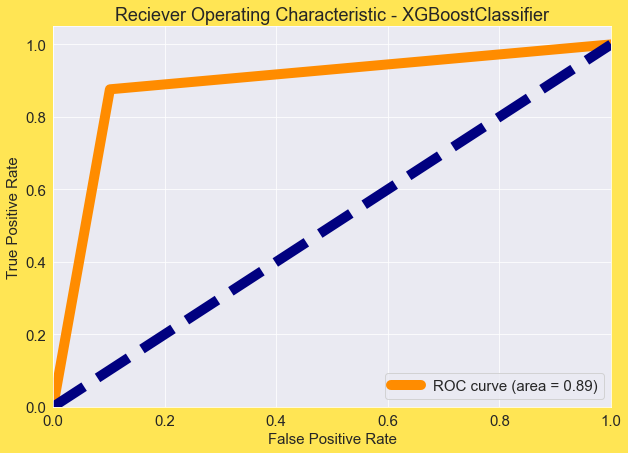

In [238]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(pred_xgbc_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color = 'darkorange',lw=10,label = 'ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0,1],[0,1],color = 'navy',lw = 10, linestyle = '--')
plt.xlim([0.0,1.0]) # limitation
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Reciever Operating Characteristic - XGBoostClassifier')
plt.legend(loc='lower right') 
plt.show()

# we can say that our model is working 89% using XGBClassifier 

## Saving the Model

In [239]:
import pickle
filename = 'insurancefrauds.pkl'
pickle.dump(xgbc,open(filename,'wb'))

In [240]:
import numpy as np
a = np.array(y_test)
predicted = np.array(xgbc.predict(x_test))
df_com = pd.DataFrame({'Original':a,'Predicted':predicted},index = range(len(a)))
df_com.sample(20)
# comparison of predicted and original target values

,Original,Predicted
270,0,0
7,0,0
45,0,0
160,1,1
65,1,1
295,0,0
429,0,0
70,1,1
355,0,0
86,1,1
